# **Chapter 4: Variational Methods in Image Processing and Computer Vision**

## **1. Euler–Lagrange Equations and Gradient Descent**

In [162]:
from sympy import *

# Symbols
z = Symbol('z', real=True)
λ1 = Symbol('λ1', real=True)
λ2 = Symbol('λ2', real=True, nonzero=True) 

# Unnormalized PDF
f = exp(λ1 - 1 + λ2*z)

# Normalization constraint
Z = integrate(f, (z, 0, 1))

# Solve normalization for λ1
λ1_expr = solve(Z - 1, λ1)[0]

# Substitute λ1 back into the PDF
f_Z = simplify(f.subs(λ1, λ1_expr))

f_Z

λ2*exp(z*λ2)/(exp(λ2) - 1)

### **Brightness Constraint and Special Cases**

In [169]:
from sympy import *

# Symbols
z = Symbol('z', real=True)
λ2 = Symbol('λ2', real=True, nonzero=True)
μ0 = Symbol('μ0', real=True)

# Maximum-entropy PDF on [0,1] (after normalization)
f_Z = λ2 * exp(λ2*z) / (exp(λ2) - 1)

# Mean constraint E[Z] = μ0
Z = integrate(z * f_Z, (z, 0, 1))
Z = simplify(Z)

# Keep the constraint implicit (this is the correct form)
mean_constraint = Eq(Z, μ0)

# Output
mean_constraint

Eq((λ2*exp(λ2) - exp(λ2) + 1)/(λ2*(exp(λ2) - 1)), μ0)

In [198]:
import numpy as np
import cv2
import matplotlib.pylab as plt

def get_distr(I):
    m, n = list(I.shape)
    probs = np.zeros(256)
    for i in range(m):
        for j in range(n):
            probs[I[i,j]] += 1.
    probs = probs / (m*n)
    return probs

def entropy(probs):
    probs = probs[probs > 0]
    return -np.sum(probs * (np.log2(probs)))

def plot_he_images(im_in, probs_in, im_out, probs_out, algo_name):
    plt.figure(figsize=(10,9))
    plt.gray()
    plt.subplot(221), plt.imshow(im_in, aspect='auto'), plt.axis('off'), plt.title('input', size=12)
    plt.subplot(222), plt.bar(range(256), probs_in, color='magenta')
    plt.title('input distribution of pixels\n(entropy = {:.3f})'.format(entropy(probs_in)), size=12)
    plt.subplot(223), plt.imshow(im_out, aspect='auto'), plt.axis('off'), plt.title('output (equalized)', size=12)
    plt.subplot(224), plt.bar(range(256), probs_out, color='magenta')
    plt.title('output distribution of pixels\n(entropy = {:.3f})'.format(entropy(probs_out)), size=12)
    plt.suptitle(f'Histogram Equalization with the {algo_name} algorithm', size=15)
    plt.tight_layout()
    plt.show()

im_in = cv2.imread('images/baba.jpg', 0)
probs_in = get_distr(im_in)

[-1.24052414]


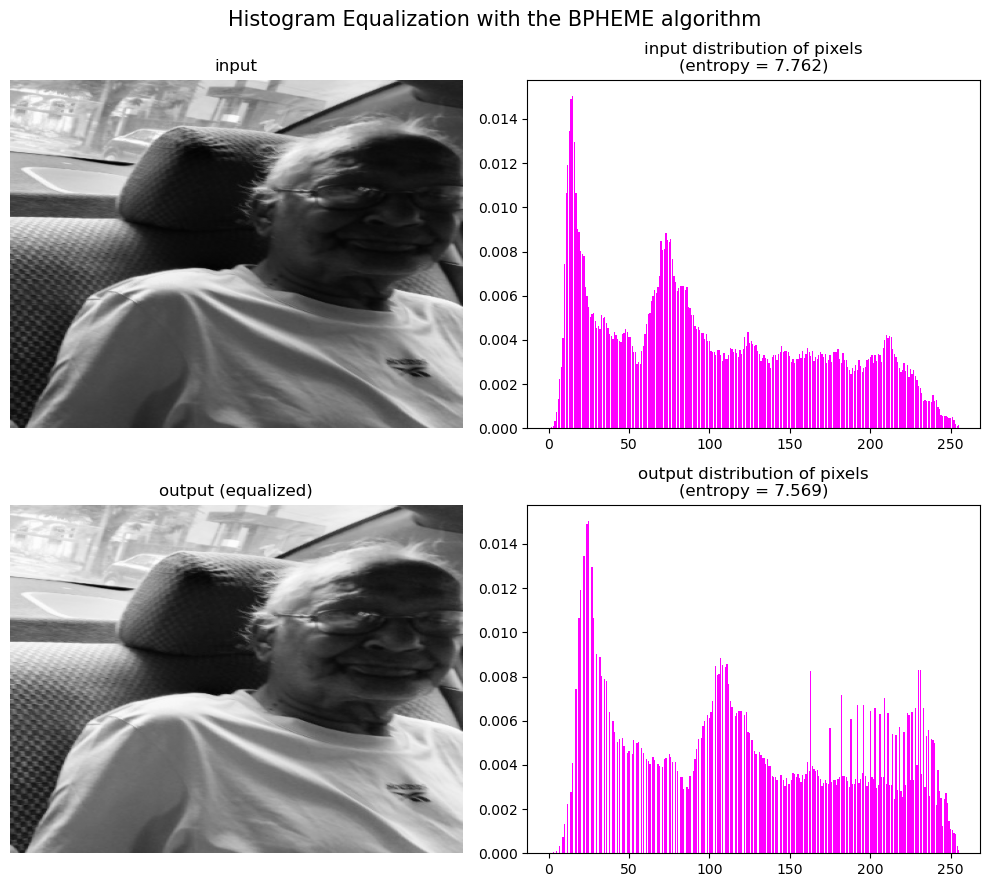

In [206]:
# BPHEME 
import scipy.optimize

def BPHEME(im):
    
    def fun(λ2, μ0):
        return ((λ2-1)*np.exp(λ2) + 1) / (λ2*(np.exp(λ2)-1)) - μ0 if λ2 != 0 else 1/2
    
    λ2 = scipy.optimize.fsolve(fun, 0.5, args=(im.mean() / 255))
    print(λ2)
    
    def fz(λ2, z):
        return λ2*np.exp(λ2*z) / (np.exp(λ2) - 1) 

    def Fz(λ2, z):
        return (np.exp(λ2*z) - 1) / (np.exp(λ2) - 1)
    
    z = np.linspace(0, 1, 256)
    if abs(λ2) < 1e-8:
        F = z
    else:
        F = Fz(λ2, z)
    lut = np.round(255 * F).astype(np.uint8)

    return lut[im]
    
im_out = BPHEME(im_in)
probs_out = get_distr(im_out)
plot_he_images(im_in, probs_in, im_out, probs_out, 'BPHEME')

## **3. Smoothing by Diffusion**
### **3.1 Linear Diffusion (Heat Equation)**
### **3.2 Perona–Malik Nonlinear Diffusion**
### **3.3 Total Variation (TV) Diffusion**
### **3.4 Variational Interpretation**
### **3.5 Python Demonstration**

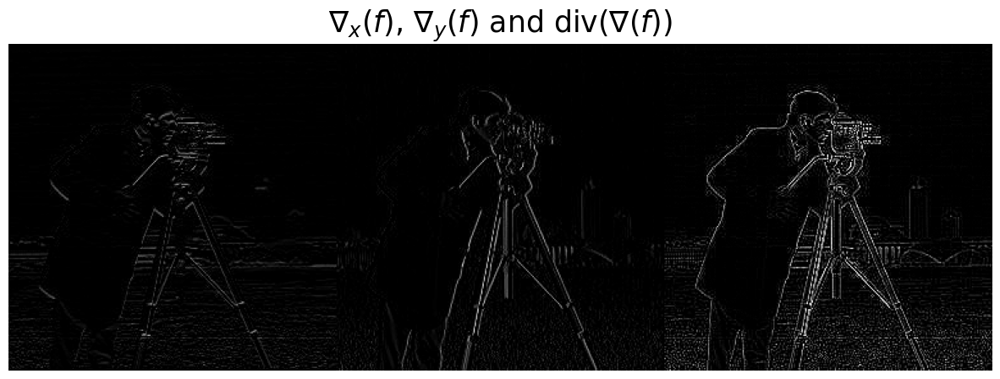

In [110]:
import cv2
from scipy import signal
import numpy as np
import matplotlib.pylab as plt
from skimage.metrics import peak_signal_noise_ratio as psnr
#from functools import reduce

def grad_x(f):
    #boundary condition Von Neumann
    g = np.zeros(f.shape)
    g[:-1,:] = f[1:,:] - f[:-1,:]
    g[-1,:] = np.zeros(f.shape[1])
    return g

def grad_y(f):
    #boundary conditions von Neumann
    g = np.zeros(f.shape)
    g[:,:-1] = f[:,1:] - f[:,:-1]
    g[:,-1] = np.zeros(f.shape[0])
    return g

def div(f_x, f_y):
    # boundary condition Dirichlet (div=-(grad)^*)
    g = np.zeros(f_x.shape)
    g_x, g_y = g.copy(), g.copy()
    g_x[1:-1,:] = f_x[1:-1,:] - f_x[:-2,:]
    g_x[0,:], g_x[-1, :] = f_x[0,:], -f_x[-2,:]
    g_y[:,1:-1] = f_y[:,1:-1] - f_y[:,:-2]
    g_y[:,0], g_y[:,-1] = f_y[:,0], -f_y[:,-2]
    g = g_x + g_y
    return g

def laplacian(f, kernel = np.array([[0, 1, 0], [1, -4, 1], [0, 1, 0]])):
    return signal.convolve2d(f, kernel, boundary='symm', mode='same')

def plot_image(f, u, f_o, ll):
    plt.figure(figsize=(15,7))
    plt.gray()
    plt.subplot(131), plt.imshow(f, aspect='auto'), plt.axis('off'), plt.title('Input (PSNR: {:.3f})'.format(psnr(f_o, f)), size=20)
    plt.subplot(132), plt.imshow(u, aspect='auto'), plt.axis('off'), plt.title('Output (PSNR: {:.3f})'.format(psnr(f_o, u)), size=20)
    plt.subplot(133), plt.plot(range(len(ll)), ll, '.-'), plt.grid()
    plt.title('Gradient Descent Cost function', size=20)
    plt.xlabel('Iteration', size=20)
    plt.ylabel('Cost function', size=20)
    plt.tight_layout()
    plt.show()

im_orig = cv2.imread('images/cameraman.png',0)
im_orig = im_orig / im_orig.max()
im_noisy = im_orig + 0.4*im_orig.max()*np.random.rand(np.prod(im_orig.shape)).reshape(im_orig.shape)
plt.figure(figsize=(15,8))
plt.gray()
plt.imshow(np.hstack((grad_x(im_orig), grad_y(im_orig), div(grad_x(im_orig), grad_y(im_orig)))), vmin=0, vmax=1), plt.axis('off')
plt.title(r'$\nabla_x(f)$, $\nabla_y(f)$ and div($\nabla(f)$)', size=25)
plt.show()

True


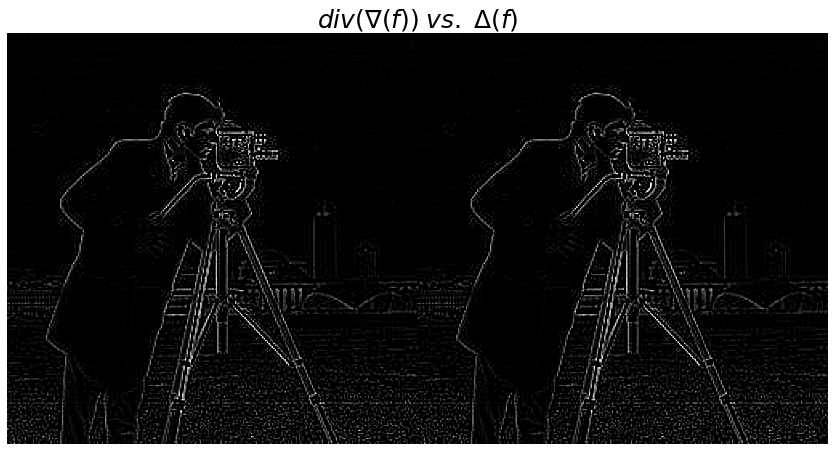

In [173]:
im_dg, im_l = div(grad_x(im_orig), grad_y(im_orig)), laplacian(im_orig)
print(np.allclose(im_dg, im_l))
plt.figure(figsize=(12,6))
plt.imshow(np.hstack((im_dg, im_l)), vmin=0, vmax=1), plt.axis('off')
plt.tight_layout()
plt.title(r'$div(\nabla(f))\; vs. \; \Delta(f)$', size=25)
plt.show()

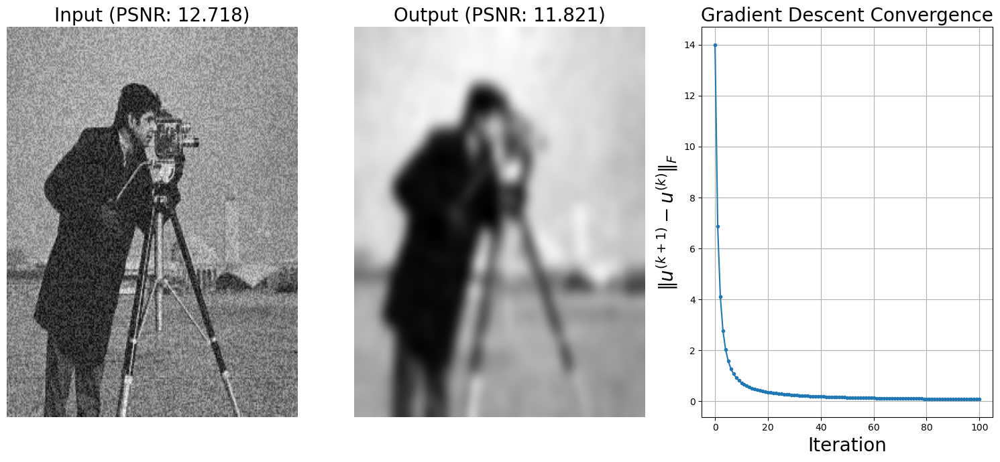

In [132]:
import warnings
warnings.filterwarnings('ignore')

def linear_diffusion(u, f, dt, T, K): # heat equation
    t = 0
    ll = []
    while t <= T:
        u1 = u + K * dt * div(grad_x(u), grad_y(u))
        ll.append(np.linalg.norm(abs(u1 - u), 'fro'))
        u = u1
        t += dt
    u = u / u.max()
    return u, ll

def plot_image(f, u, f_o, ll):
    plt.figure(figsize=(15,7))
    plt.gray()
    plt.subplot(131), plt.imshow(f, aspect='auto'), plt.axis('off'), plt.title('Input (PSNR: {:.3f})'.format(psnr(f_o, f)), size=20)
    plt.subplot(132), plt.imshow(u, aspect='auto'), plt.axis('off'), plt.title('Output (PSNR: {:.3f})'.format(psnr(f_o, u)), size=20)
    plt.subplot(133), plt.plot(range(len(ll)), ll, '.-'), plt.grid()
    plt.title('Gradient Descent Convergence', size=20)
    plt.xlabel('Iteration', size=20)
    plt.ylabel(r'$\|u^{(k+1)} - u^{(k)}\|_F$', size=20)
    plt.tight_layout()
    plt.show()

#Parameters
dt = 0.1;  #Time step
T = 10;  #Stopping time
K = 1;  #Conductivity
im_smoothed, errors = linear_diffusion(im_noisy.copy(), im_orig, dt, T, K)
plot_image(im_noisy, im_smoothed, im_orig, errors)

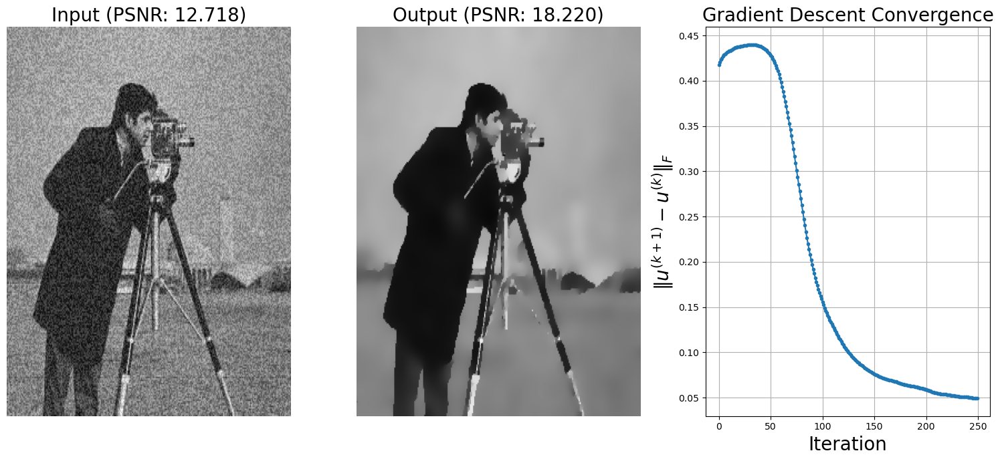

In [141]:
def perona_malik_diffusion(u, f, dt, T, α): # heat    
    t = 0
    ll = []
    u, f = 255*u, 255*f
    while t <= T:
        g_x, g_y = grad_x(u), grad_y(u)
        norm2 = g_x**2 + g_y**2
        #K = np.exp(-norm2/α**2)  #Conductivity
        K = 1/(norm2/(α**2)+1)
        u1 = u + dt * div(K*g_x, K*g_y)
        ll.append(np.linalg.norm(abs(u1 - u) / f.max(), 'fro'))        
        u = u1
        t += dt
    u = u / u.max()
    return u, ll

#Parameters
dt = 0.1;  #Time step
T = 25;  #Stopping time
α = 10;
im_smoothed, errors = perona_malik_diffusion(im_noisy.copy(), im_orig, dt, T, α)
plot_image(im_noisy, im_smoothed, im_orig, errors)

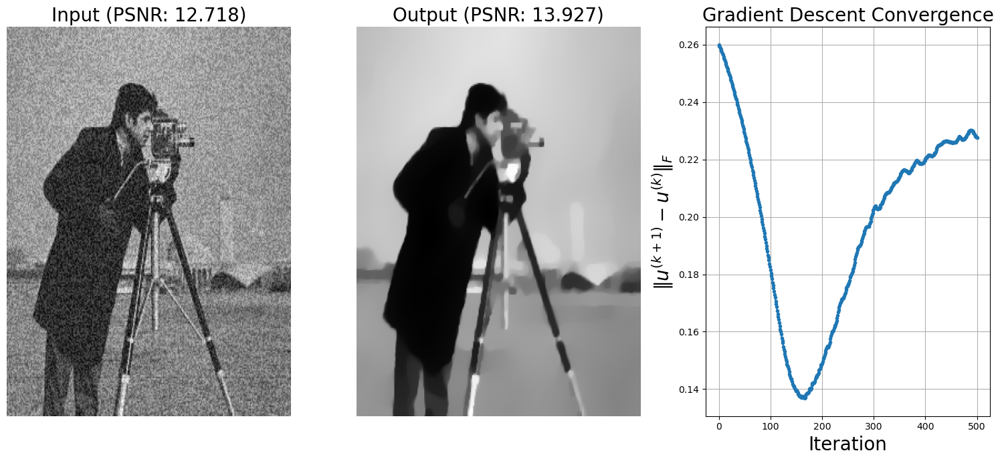

In [144]:
def tv_diffusion(u, f, dt, T, λ, ε):
    t = 0
    ll = []

    while t <= T:
        ux = grad_x(u)
        uy = grad_y(u)

        grad_norm = np.sqrt(ux**2 + uy**2 + ε)

        px = ux / grad_norm
        py = uy / grad_norm

        u1 = u + λ * dt * div(px, py)
        ll.append(np.linalg.norm(u1 - u, 'fro'))
        u = u1
        
        t += dt

    u = u / u.max()
    return u, ll

# Parameters
dt = 0.01        # Time step
T = 5            # Stopping time
λ = 0.05          # TV weight
ε = 1e-8         # Gradient regularization

im_smoothed, errors = tv_diffusion(im_noisy.copy(), im_orig, dt, T, λ, ε)
plot_image(im_noisy, im_smoothed, im_orig, errors)

### **3.6 Anisotropic Diffusion via Matrix-Valued Potentials**

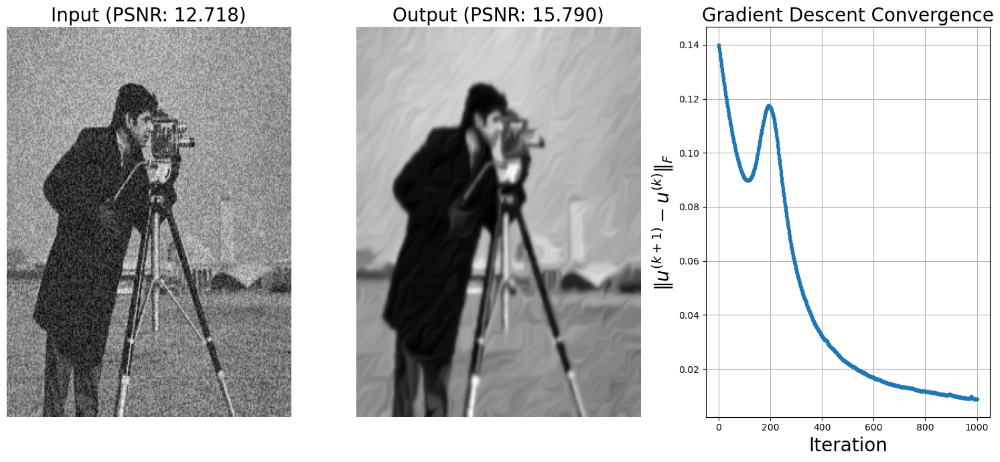

In [145]:
def anisotropic_diffusion(u, f, dt, T, K, alpha):
    """
    Matrix-based anisotropic diffusion (Weickert-style)

    Parameters:
        u     : initial image (noisy)
        f     : reference image (for error monitoring)
        dt    : time step
        T     : stopping time
        K     : edge sensitivity parameter
        alpha : minimal diffusion across edges
    """
    t = 0
    ll = []

    while t <= T:
        # Image gradients
        ux = grad_x(u)
        uy = grad_y(u)

        # --- Structure tensor components ---
        Jxx = gaussian(ux**2, sigma=1)
        Jyy = gaussian(uy**2, sigma=1)
        Jxy = gaussian(ux * uy, sigma=1)

        # --- Eigenvalues of structure tensor ---
        tmp = np.sqrt((Jxx - Jyy)**2 + 4 * Jxy**2)
        mu1 = 0.5 * (Jxx + Jyy + tmp)   # across-edge
        mu2 = 0.5 * (Jxx + Jyy - tmp)   # along-edge

        # --- Eigenvectors ---
        e1x = 2 * Jxy
        e1y = Jyy - Jxx + tmp
        norm = np.sqrt(e1x**2 + e1y**2) + 1e-8
        e1x /= norm
        e1y /= norm

        e2x = -e1y
        e2y =  e1x

        # --- Diffusion eigenvalues ---
        c1 = alpha
        c2 = alpha + (1 - alpha) * np.exp(-mu1 / (K*K))

        # --- Diffusion tensor ---
        Dxx = c1 * e1x**2 + c2 * e2x**2
        Dyy = c1 * e1y**2 + c2 * e2y**2
        Dxy = c1 * e1x * e1y + c2 * e2x * e2y

        # --- Flux ---
        px = Dxx * ux + Dxy * uy
        py = Dxy * ux + Dyy * uy

        # --- Update ---
        u1 = u + dt * div(px, py)

        # Error (monitoring only)
        ll.append(np.linalg.norm(u1 - u, 'fro'))
        u = u1
        t += dt

    u = u / u.max()
    return u, ll

# Parameters
dt = 0.1        # Time step
T = 100            # Stopping time
K = 0.05         # Edge sensitivity
alpha = 0.01     # Minimal diffusion across edges

im_smoothed, errors = anisotropic_diffusion(
    im_noisy.copy(),
    im_orig,
    dt,
    T,
    K,
    alpha
)

plot_image(im_noisy, im_smoothed, im_orig, errors)

## **4. Tikhonov and Total Variation Denoising**

In [83]:
def Tikhonov(u, f, λ, **kwargs):
    return (f -  u) + λ*div(grad_x(u), grad_y(u))
    # return (f -  u) + λ*laplacian(u)

def TV(u, f, λ,  ε=1e-12, **kwargs):
    u_x, u_y = grad_x(u), grad_y(u)
    norm_ε = np.sqrt(u_x**2 + u_y**2 + ε)
    return 2*λ*(f -  u) + div(u_x/norm_ε, u_y/norm_ε) 

def apply_gradient_descent(f, reg_EL, λ=2, η=0.02, niter=100, **kwargs):
    u = np.zeros_like(f) #f.astype(float) 
    ll = []
    for i in range(niter):
        del_u = reg_EL(u, f, λ, **kwargs)
        u1 = u + η*del_u
        l = np.linalg.norm(abs(u1 - u), 'fro')
        ll.append(l)
        #print(l)
        u = u1 
    u = u / u.max()
    return u, ll

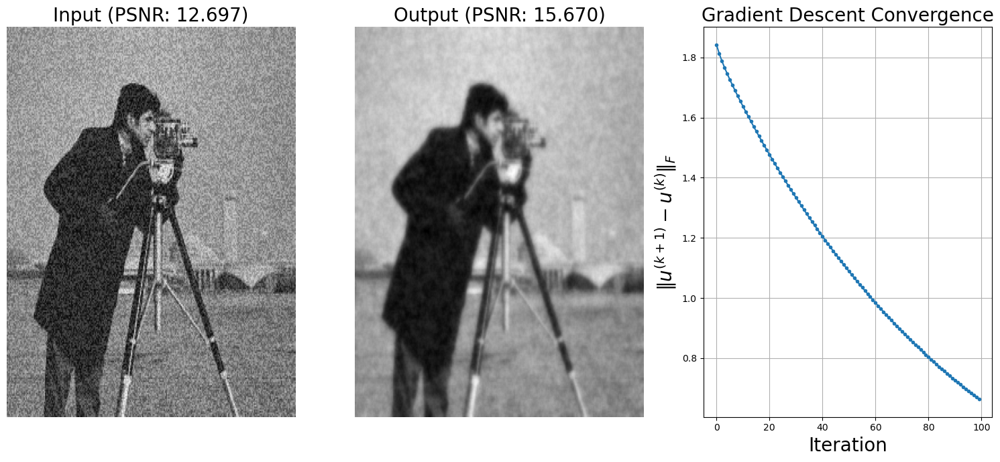

In [85]:
im_orig = cv2.imread('images/cameraman.png', 0)
im_orig = im_orig / im_orig.max()
im_noisy = im_orig + 0.4 * im_orig.max() * np.random.rand(*im_orig.shape)
im_smoothed, errors = apply_gradient_descent(im_noisy, Tikhonov, λ=5, η=0.01)
plot_image(im_noisy, im_smoothed, im_orig, errors)

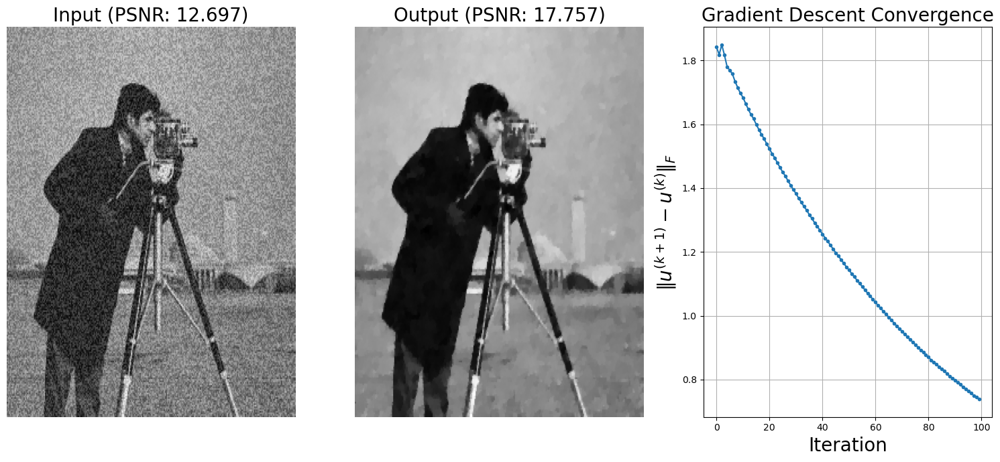

In [86]:
im_smoothed, errors = apply_gradient_descent(im_noisy, TV, λ=5, η=0.001)
plot_image(im_noisy, im_smoothed, im_orig, errors)

## **5. Tikhonov and TV Deblurring**

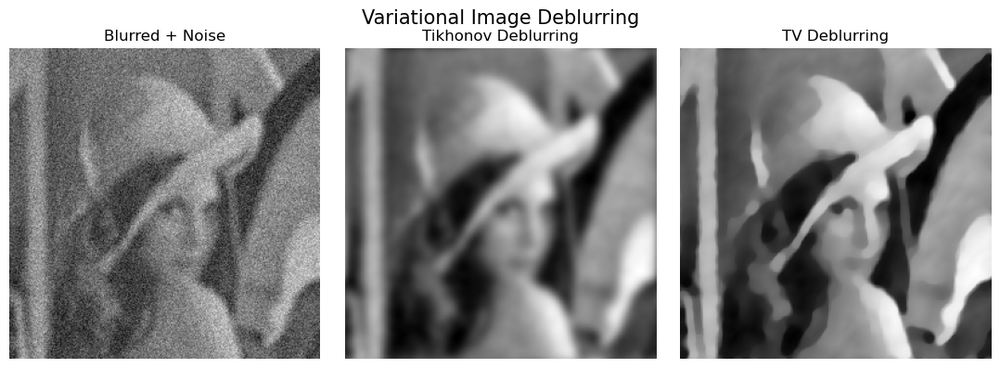

In [107]:
import numpy as np
from scipy.signal import convolve2d
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.filters import gaussian

# Helper functions
def grad_x(u): return np.roll(u, -1, axis=1) - u
def grad_y(u): return np.roll(u, -1, axis=0) - u
def div(px, py): return (px - np.roll(px, 1, axis=1)) + (py - np.roll(py, 1, axis=0))

def laplacian(u):
    return -4*u + np.roll(u, 1, 0) + np.roll(u, -1, 0) + np.roll(u, 1, 1) + np.roll(u, -1, 1)

# Convolution helper
def blur(u, h):
    return convolve2d(u, h, mode='same', boundary='symm')

# Deblurring energies
def Tikhonov_deblur(u, f, h, λ):
    return convolve2d(convolve2d(u, h, mode='same', boundary='symm') - f, np.flip(h), mode='same', boundary='symm') - λ * laplacian(u)

def TV_deblur(u, f, h, λ, ε=1e-12):
    u_x, u_y = grad_x(u), grad_y(u)
    norm_ε = np.sqrt(u_x**2 + u_y**2 + ε)
    reg = div(u_x / norm_ε, u_y / norm_ε)
    return convolve2d(convolve2d(u, h, mode='same', boundary='symm') - f, np.flip(h), mode='same', boundary='symm') - λ * reg

# Gradient descent
def apply_gradient_descent(f, h, reg_EL, λ=1, η=0.02, niter=200):
    u = np.copy(f)
    ll = []
    for i in range(niter):
        del_u = reg_EL(u, f, h, λ)
        u1 = u - η * del_u
        l = np.linalg.norm(u1 - u, 'fro')
        ll.append(l)
        u = u1
    u = (u - u.min()) / (u.max() - u.min())
    return u, ll

# Example
img = rgb2gray(imread('images/lena.jpg'))
h = np.ones((7,7)) / 49  # box blur kernel
f = blur(img, h) + 0.1 * np.random.randn(*img.shape)

λ = 0.2
u_tik, _ = apply_gradient_descent(f, h, Tikhonov_deblur, λ=10)
u_tv, _ = apply_gradient_descent(f, h, TV_deblur, λ=0.1)

plt.figure(figsize=(11,4))
plt.subplot(131), plt.imshow(f, cmap='gray'), plt.axis('off'), plt.title('Blurred + Noise', size=12)
plt.subplot(132), plt.imshow(u_tik, cmap='gray'), plt.axis('off'), plt.title('Tikhonov Deblurring', size=12)
plt.subplot(133), plt.imshow(u_tv, cmap='gray'), plt.axis('off'), plt.title('TV Deblurring', size=12)
plt.suptitle('Variational Image Deblurring', size=15)
plt.tight_layout()
plt.show()

## **6. Tikhonov and Total Variation (TV) Inpainting**

In [87]:
def Tikhonov_mask(u, f, m, λ, **kwargs):
    #return m*(f -  u) + λ*divergence(np.gradient(u))
    return m*(f -  u) + λ*div(grad_x(u), grad_y(u))

def TV_mask(u, f, m, λ,  ε=1e-12, **kwargs):
    #u_x, u_y = np.gradient(u)
    u_x, u_y = grad_x(u), grad_y(u)
    norm_ε = np.sqrt(u_x**2 + u_y**2 + ε)
    return 2*λ*m*(f -  u) + div(u_x/norm_ε, u_y/norm_ε)

def apply_gradient_descent_with_mask(f, m, reg_EL, λ=2, η=0.02, niter=100, **kwargs):
    u = np.zeros_like(f) #f.astype(float) 
    ll = []
    for i in range(niter):
        del_u = reg_EL(u, f, m, λ, **kwargs)
        u1 = u + η*del_u
        l = np.linalg.norm(abs(u1 - u), 'fro')
        ll.append(l)
        u = u1 
        u = np.clip(u, 0, 1)
    u = u / u.max()
    return u, ll

In [88]:
im_orig = cv2.imread('images/bird.png',0) 
im_mask = cv2.imread('images/bird_mask.png',0)  
im_mask = ~im_mask
im_masked = im_orig & im_mask
im_orig = im_orig / im_orig.max()
im_masked, im_mask = im_masked / im_masked.max(), im_mask / im_mask.max()

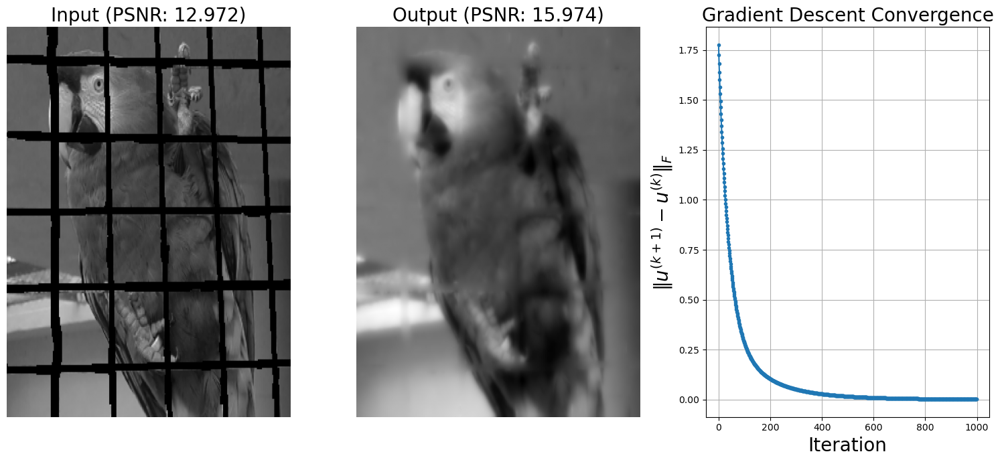

In [90]:
im_inpainted, errors = apply_gradient_descent_with_mask(im_masked, im_mask, Tikhonov_mask, λ=5, η=0.02, niter=1000)
plot_image(im_masked, im_inpainted, im_orig, errors)

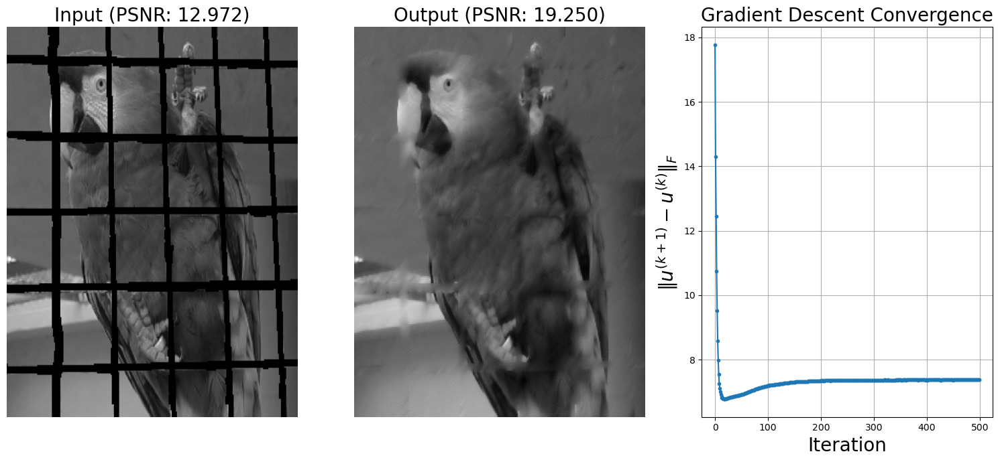

In [69]:
im_inpainted, errors = apply_gradient_descent_with_mask(im_masked, im_mask, TV_mask, λ=10, η=0.01, niter=500)
plot_image(im_masked, im_inpainted, im_orig, errors)

## **7. Curvature-Driven and Euler’s Elastica Inpainting**

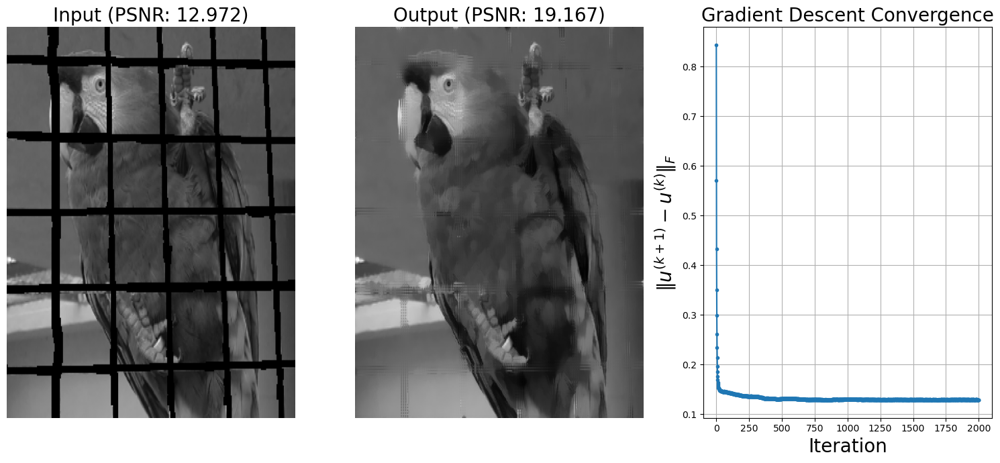

In [79]:
import numpy as np
import matplotlib.pyplot as plt

def get_gradient(u):
    """Central differences for better stability in curvature."""
    ux = (np.roll(u, -1, axis=1) - np.roll(u, 1, axis=1)) / 2
    uy = (np.roll(u, -1, axis=0) - np.roll(u, 1, axis=0)) / 2
    return ux, uy

def get_divergence(fx, fy):
    """Adjoint divergence operator."""
    fxx = (np.roll(fx, -1, axis=1) - np.roll(fx, 1, axis=1)) / 2
    fyy = (np.roll(fy, -1, axis=0) - np.roll(fy, 1, axis=0)) / 2
    return fxx + fyy

def curvature(u, eps=1e-5):
    ux, uy = get_gradient(u)
    norm = np.sqrt(ux**2 + uy**2 + eps)
    nx, ny = ux / norm, uy / norm
    return get_divergence(nx, ny)

def run_elastica(f, mask, iterations=2000, dt=0.005, lmbda=20, alpha=0.1, beta=1.0):
    """
    f: input image (0 to 1)
    mask: 1 for known, 0 for missing
    """
    u = np.copy(f)
    m = mask.astype(np.float64)
    
    # Pre-calculate constants
    eps = 1e-5
    ll = []
    for i in range(iterations):
        ux, uy = get_gradient(u)
        grad_norm = np.sqrt(ux**2 + uy**2 + eps)
        k = curvature(u, eps)
        
        # 1. Fidelity: Keeps the image from 'fading' by locking to f
        fidelity = lmbda * m * (f - u)
        
        # 2. Diffusion: EE term
        # Higher alpha = more TV (edge preservation)
        # Higher beta = more Elastica (curve completion)
        coeff = (alpha + beta * k**2) / grad_norm
        reg = get_divergence(coeff * ux, coeff * uy)
        
        # 3. Update (The Gradient Descent)
        u1 = u + dt * (fidelity + reg)
        u1 = np.clip(u1, 0, 1)
        l = np.linalg.norm(abs(u1 - u), 'fro')
        ll.append(l)
        u = u1
            
    return u, ll

im_inpainted, errors = run_elastica(im_masked, im_mask)
plot_image(im_masked, im_inpainted, im_orig, errors)

## **8. Primal–Dual Methods for Variational Inpainting**
### **Variational TV Inpainting Formulation**

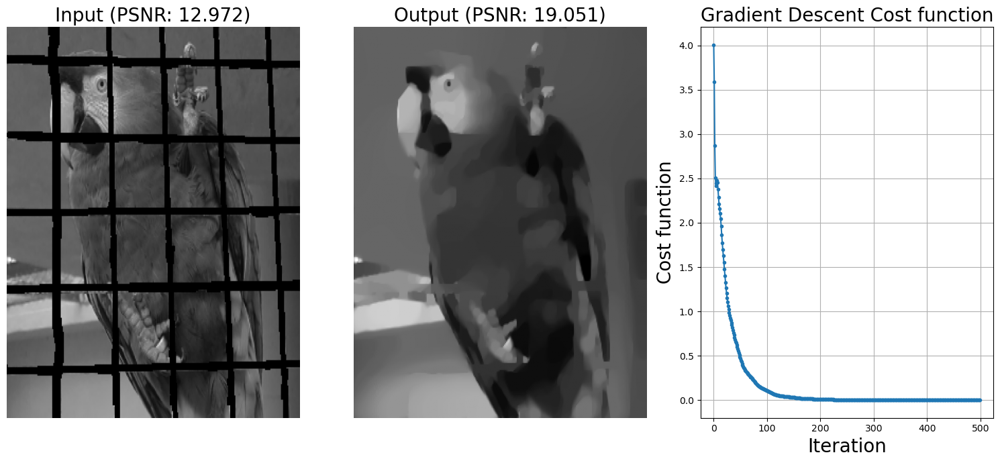

In [36]:
def primal_dual_tv_inpaint(f, m, lmbda=10, niter=500):
    # 1. Initialization
    u = np.copy(f)
    u_bar = np.copy(f)
    p_x = np.zeros_like(f)
    p_y = np.zeros_like(f)
    
    # 2. Step sizes (Must satisfy tau * sigma * 8 < 1)
    tau = 0.05
    sigma = 1.0 / (8.0 * tau)
    ll = []
    
    for i in range(niter):
        u_old = np.copy(u)
        
        # --- Dual Update ---
        # Compute gradient of the 'relaxed' primal variable
        ux = np.roll(u_bar, -1, axis=1) - u_bar
        uy = np.roll(u_bar, -1, axis=0) - u_bar
        
        p_x = p_x + sigma * ux
        p_y = p_y + sigma * uy
        
        # Projection: p = p / max(1, |p|)
        norm = np.maximum(1, np.sqrt(p_x**2 + p_y**2))
        p_x /= norm
        p_y /= norm
        
        # --- Primal Update ---
        # Compute divergence of dual variable
        div_p = (p_x - np.roll(p_x, 1, axis=1)) + (p_y - np.roll(p_y, 1, axis=0))
        
        # Proximal operator for the L2 fidelity term
        # Formula: u = (u - tau*div_p + tau*lmbda*m*f) / (1 + tau*lmbda*m)
        u_new = (u + tau * div_p + tau * lmbda * m * f) / (1 + tau * lmbda * m)
        ll.append(np.linalg.norm(u_new - u, 'fro'))
        u = u_new
       
        # --- Extrapolation (Relaxation) ---
        u_bar = 2 * u - u_old
        
    return np.clip(u, 0, 1), ll

im_inpainted, errors = primal_dual_tv_inpaint(im_masked, im_mask)
plot_image(im_masked, im_inpainted, im_orig, errors)

## **9. Mumford–Shah Inpainting**

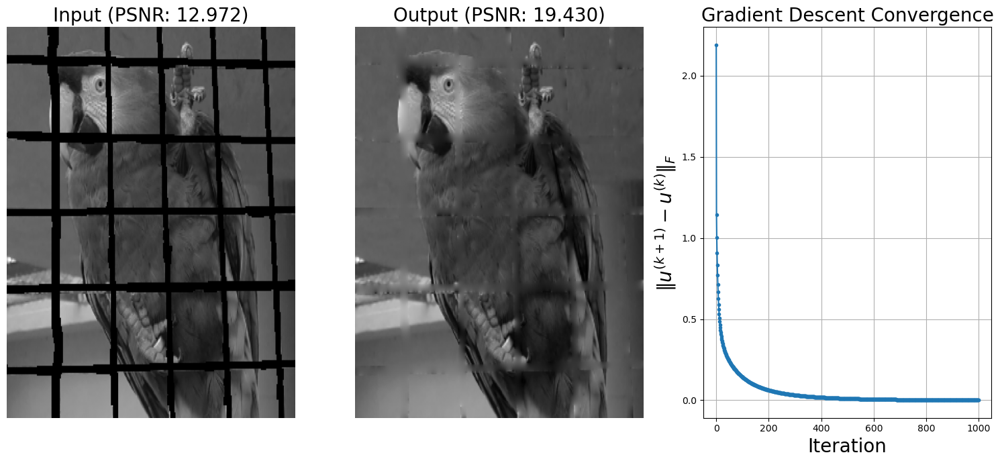

In [94]:
import numpy as np

def grad(u):
    ux = np.roll(u, -1, axis=1) - u
    uy = np.roll(u, -1, axis=0) - u
    return ux, uy

def div(px, py):
    return (
        px - np.roll(px, 1, axis=1) +
        py - np.roll(py, 1, axis=0)
    )

def laplacian(u):
    return (
        -4*u +
        np.roll(u, 1, 0) + np.roll(u, -1, 0) +
        np.roll(u, 1, 1) + np.roll(u, -1, 1)
    )

def safe_normalize(u, eps=1e-8):
    return u / (u.max() + eps)

def mumford_shah_inpaint(
    f, m,
    lmbda=20.0,
    eps=0.01,
    dt_u=0.05,
    dt_v=0.05,
    niter=1000
):
    """
    Stable Ambrosio–Tortorelli (Mumford–Shah) inpainting.
    """

    # --- Initialization ---
    u = np.copy(f)
    v = np.ones_like(f)
    errors = []

    for k in range(niter):

        u_old = u.copy()

        # ===== u-update =====
        ux, uy = grad(u)
        v2 = v * v

        div_term = div(v2 * ux, v2 * uy)

        u = u + dt_u * (
            div_term +
            lmbda * m * (f - u)
        )

        # ===== v-update =====
        ux, uy = grad(u)
        grad_u_sq = ux**2 + uy**2

        v = v + dt_v * (
            eps * laplacian(v)
            - grad_u_sq * v
            + (1 - v) / (4 * eps)
        )

        # Enforce theory: 0 < v ≤ 1
        v = np.clip(v, eps, 1.0)

        # ===== convergence diagnostic =====
        err = np.linalg.norm(u - u_old, 'fro')
        errors.append(err)

        # Safety stop
        if not np.isfinite(u).all():
            raise RuntimeError(f"NaN detected at iteration {k}")

    return safe_normalize(u), v, errors


im_inpainted, im_edge, errors = mumford_shah_inpaint(im_masked, im_mask)
plot_image(im_masked, im_inpainted, im_orig, errors)

## **10. Variational Image Inpainting via Navier–Stokes Equations**

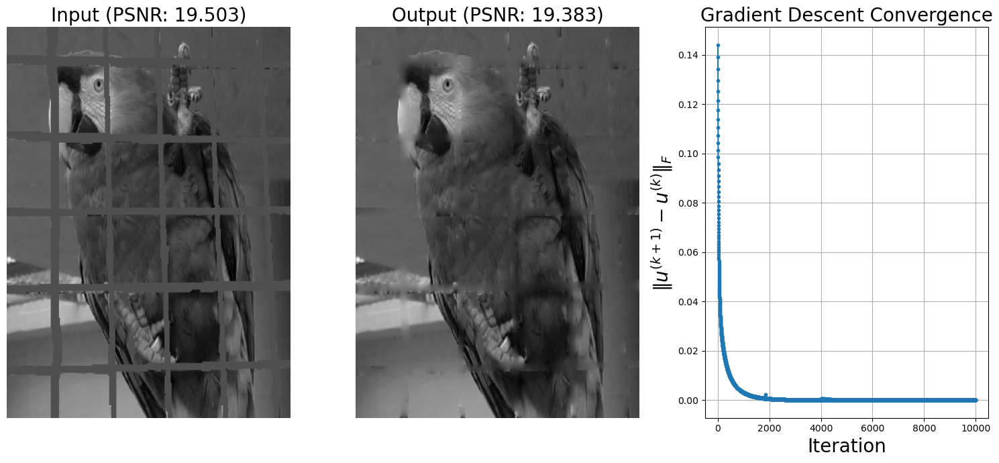

In [287]:
import numpy as np
import cv2

def gradient(u):
    ux = np.zeros_like(u)
    uy = np.zeros_like(u)
    ux[:,1:-1] = (u[:,2:] - u[:,:-2]) / 2
    uy[1:-1,:] = (u[2:,:] - u[:-2,:]) / 2
    return ux, uy

def laplacian(u):
    lap = np.zeros_like(u)
    lap[1:-1,1:-1] = (
        -4*u[1:-1,1:-1]
        + u[1:-1,2:] + u[1:-1,:-2]
        + u[2:,1:-1] + u[:-2,1:-1]
    )
    return lap

def navier_stokes_inpaint(I, mask, dt=0.01, T=300, eps=0.05):
    I = I.astype(np.float64)
    I0 = I.copy()

    t = 0
    ll = []

    while t < T:
        Ix, Iy = gradient(I)
        lapI = laplacian(I)
        lapIx, lapIy = gradient(lapI)

        # Normalize gradients (critical!)
        gnorm = np.sqrt(Ix**2 + Iy**2) + 1e-8
        Ix /= gnorm
        Iy /= gnorm

        adv = -Iy * lapIx + Ix * lapIy
        I1 = I + dt * (adv + eps * lapI)

        # Enforce fidelity ONLY outside hole
        I1[mask != 0] = I0[mask != 0]

        ll.append(np.linalg.norm(I1 - I, 'fro'))
        I = I1
        t += dt

    return np.clip(I, 0, 1), ll

# Usage Example:
# Assuming im_masked is your image and im_mask is your hole (0=hole, 255=data)
# result = navier_stokes_inpaint(im_masked, im_mask)
im_orig = cv2.imread('images/bird.png', 0)
im_mask = cv2.imread('images/bird_mask.png', 0)
# Initialize hole with mean value
im_mask = ~im_mask
im_masked = im_orig & im_mask
im_masked[im_mask == 0] = np.mean(im_orig[im_mask != 0])
im_orig = im_orig / im_orig.max()
im_masked = im_masked / im_masked.max()
im_inpainted, errors = navier_stokes_inpaint(im_masked, im_mask, dt=0.01, T=100, eps=0.5)
plot_image(im_masked, im_inpainted, im_orig, errors)

## **11. Image Super-Resolution with Variational Methods**

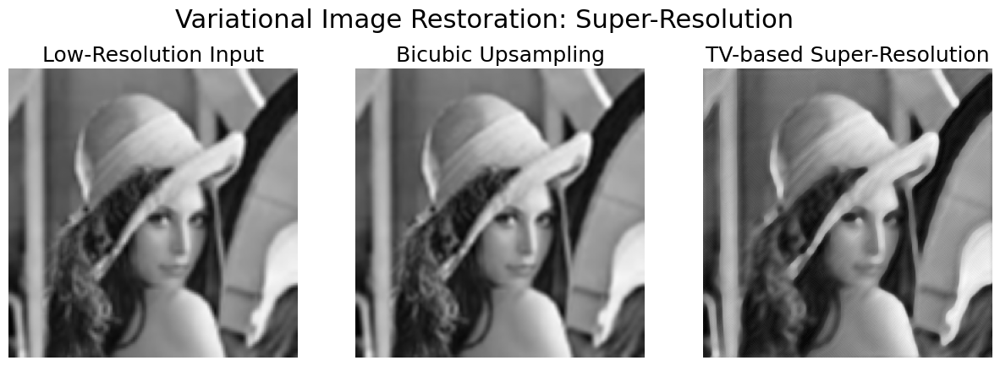

In [3]:
import numpy as np
from scipy.signal import convolve2d
from skimage.io import imread
from skimage.transform import rescale, resize
from skimage.color import rgb2gray
import matplotlib.pyplot as plt

# --- Helper functions ---
def grad_x(u): return np.roll(u, -1, axis=1) - u
def grad_y(u): return np.roll(u, -1, axis=0) - u
def div(px, py): return (px - np.roll(px, 1, axis=1)) + (py - np.roll(py, 1, axis=0))

def blur(u, h): 
    return convolve2d(u, h, mode='same', boundary='symm')

def downsample(u, s=2): 
    return u[::s, ::s]

def upsample(u, s=2):
    return resize(u, (u.shape[0]*s, u.shape[1]*s), order=3)  # bicubic

# --- Super-resolution energy ---
def TV_SR(u, f, h, s, λ, ε=1e-12):
    # forward model: blur + downsample
    u_blur = blur(u, h)
    u_down = downsample(u_blur, s)
    # adjoint model: upsample + deblur (transpose operators)
    err = upsample(u_down - f, s)
    err_back = convolve2d(err, np.flip(h), mode='same', boundary='symm')
    # TV regularization
    u_x, u_y = grad_x(u), grad_y(u)
    norm_ε = np.sqrt(u_x**2 + u_y**2 + ε)
    reg = div(u_x / norm_ε, u_y / norm_ε)
    return err_back - λ * reg

# --- Gradient descent solver ---
def apply_SR(f, h, s=2, λ=0.05, η=0.2, niter=100):
    u = upsample(f, s)
    ll = []
    for i in range(niter):
        del_u = TV_SR(u, f, h, s, λ)
        u1 = u - η * del_u
        diff = np.linalg.norm(u1 - u, 'fro')
        ll.append(diff)
        u = u1
    u = (u - u.min()) / (u.max() - u.min())
    return u, ll

# --- Example ---
img = rgb2gray(imread('images/lena.jpg'))
scale = 2
h = np.ones((5,5)) / 25  # blur kernel
f = downsample(blur(img, h), scale)

# Bicubic upsampling for initialization
u_bicubic = upsample(f, scale)
# Variational refinement
u_tv, _ = apply_SR(f, h, s=scale, λ=0.05, η=0.2, niter=50)

plt.figure(figsize=(15,5))
plt.subplot(131), plt.imshow(f, cmap='gray'), plt.axis('off'), plt.title('Low-Resolution Input', size=18)
plt.subplot(132), plt.imshow(u_bicubic, cmap='gray'), plt.axis('off'), plt.title('Bicubic Upsampling', size=18)
plt.subplot(133), plt.imshow(u_tv, cmap='gray'), plt.axis('off'), plt.title('TV-based Super-Resolution', size=18)
plt.suptitle('Variational Image Restoration: Super-Resolution', size=22)
plt.show()


## **12. Horn & Schunck Optical Flow: A Variational PDE Perspective**

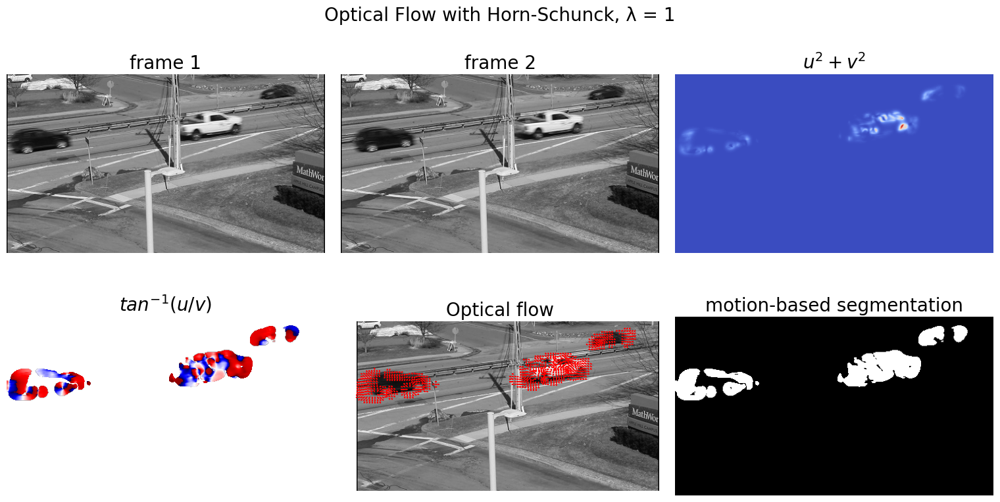

In [209]:
from scipy.signal import convolve2d
from skimage.io import imread
import numpy as np
import matplotlib.pylab as plt
import warnings
warnings.filterwarnings('ignore')

#compute derivatives of the image intensity values along the x, y, time
def convolve(im, kernel):
    return convolve2d(im, kernel, boundary='symm', mode='same')

def get_derivatives(im1, im2):
    #derivative masks
    dx_kernel = np.array([[-1., 1.], [-1., 1.]]) / 4
    dy_kernel = np.array([[-1., -1.], [1., 1.]]) / 4
    dt_kernel = np.array([[1., 1.], [1., 1.]]) / 4
    f_x = convolve(im1, dx_kernel) + convolve(im2, dx_kernel)
    f_y = convolve(im1, dy_kernel) + convolve(im2, dx_kernel)
    f_t = convolve(im2, dt_kernel) + convolve(im1, -dt_kernel)
    return (f_x, f_y, f_t)

def horn_schunck(f1, f2, dt, T, λ = 1): 
    f_x, f_y, f_t = get_derivatives(f1, f2)
    u, v = np.zeros_like(f1), np.zeros_like(f1)
    t = 0
    while t <= T:
        u = u + dt * (λ**2*laplacian(u) - (f_x*u + f_y*v + f_t)*f_x)
        v = v + dt * (λ**2*laplacian(v) - (f_x*u + f_y*v + f_t)*f_y)
        t += dt
    u, v = u / u.max(), v / v.max()
    return u, v

def plot_images(u, v, im1, im2, λ, ε=1e-1, scale=5): #1/5
    
    u, v = u*scale, v*scale
    mag, dr = u**2 + v**2, np.arctan(u/v)
    avg_mag = np.mean(mag)
    dr[mag < avg_mag] = np.nan

    plt.figure(figsize=(15,8))
    plt.subplots_adjust(0,0,1,0.9,0.05,0.05)
    plt.subplot(231); plt.axis('off'); plt.imshow(im1, cmap='gray'); plt.title('frame 1', fontsize=20)
    plt.subplot(232); plt.axis('off'); plt.imshow(im2, cmap='gray'); plt.title('frame 2', fontsize=20)
    plt.subplot(233); plt.axis('off'); plt.imshow(mag, cmap='coolwarm'); plt.title(r'$u^2+v^2$', fontsize=20)
    plt.subplot(234); plt.axis('off'); plt.imshow(dr, cmap='seismic'); plt.title(r'$tan^{-1}(u/v)$', fontsize=20)
    plt.subplot(235), plt.axis('off'), plt.imshow(im2, cmap='gray'), plt.title('Optical flow', fontsize=20)
    # draw the velocity vectors
    s = 4
    for i in range(0, u.shape[0], s):
        for j in range(0, u.shape[1],s):
            dx, dy = u[i,j], v[i,j]
            mag = np.sqrt(dx**2 + dy**2)
            #draw only significant changes
            if mag > avg_mag and mag > ε:
                plt.arrow(j,i, dx, dy, head_width=1, head_length=2, color = 'red')
    # motion segment
    plt.subplot(236), plt.axis('off')
    motion = np.zeros(u.shape)
    #motion[mag > ε] = 1 
    mag, dr = u**2 + v**2, np.arctan(u/v)
    motion[mag > np.mean(mag)] = 1
    motion = gray2rgb(motion) if im2.ndim == 3 else motion
    #plt.imshow(0.1*im2 + 0.9*motion, cmap='coolwarm'),  plt.title('motion segmentation', fontsize=20)
    plt.imshow(motion, cmap='gray'),  plt.title('motion-based segmentation', fontsize=20)
    plt.suptitle(f'Optical Flow with Horn-Schunck, λ = {λ}', size=20)
    plt.show()


im1, im2 = imread('images/frame_0361.jpg', as_gray=True), imread('images/frame_0362.jpg', as_gray=True)
#Parameters
dt = 0.1;  #Time step
T = 25;  #Stopping time
λ = 1
u, v = horn_schunck(im1, im2, dt, T, λ)
plot_images(u, v, im1, im2, λ)

## **13. Mumford–Shah Segmentation with Ambrosio–Tortorelli Approximation**

In [1]:
# Mumford-Shah Ambrosio-Tortorelli
def segment_MS_AT(f, α, β, ρ, η, niter):
    u = f.copy() #f.astype(float) 
    u_x, u_y = grad_x(u), grad_y(u)
    norm2 = u_x**2 + u_y**2
    v = 1 / (1 + 2*α*ρ*norm2)  
    η1, η2 = η, 10**4*η
    ll = []
    for i in range(niter):
        u_x, u_y = grad_x(u), grad_y(u)
        norm2 = u_x**2 + u_y**2
        del_v = div(grad_x(v), grad_y(v)) - 2 * α * norm2 * v / ρ - (v - 1) / ρ**2 # ∇2v −2α|∇u|2v/ρ −(v − 1)/ρ2
        v1 = v + η1*del_v
        l2 = np.linalg.norm(abs(v1 - v), 'fro')
        v = v1
        v = (v - v.min()) / (v.max() - v.min())
        u_x, u_y = grad_x(u), grad_y(u)
        del_u = div(v**2*u_x, v**2*u_y) - (β / α) * (u - f)   # ∇ · (v2∇u) − β/α (u − f)
        u1 = u + η2*del_u # just using different learning rates
        l1 = np.linalg.norm(abs(u1 - u), 'fro')
        u = u1         
        #u = (u - u.min()) / (u.max() - u.min())
        l = l1 + l2
        ll.append(l)
    
    return u, v, ll

def plot_images(f, u, v, l, itr):
    plt.figure(figsize=(20,9))
    plt.gray()
    plt.subplots_adjust(0,0,1,0.8,0.05,0.05)
    plt.imshow(np.hstack((f, u, v))), plt.axis('off')
    plt.title('Ambrosio-Tortorelli approximation of Mumford-Shah functional\n' +
              '   original image                segmented image              regularized edge set', 
              size=25)
    plt.show()

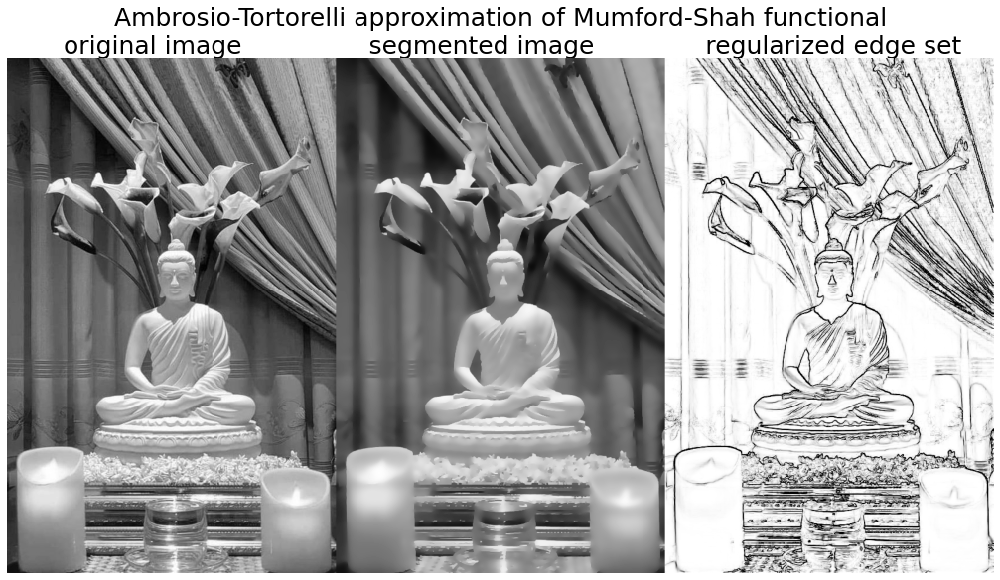

In [255]:
#np.set_printoptions(suppress=True)
f_orig = cv2.imread('images/buddha.jpg', 0)
f_orig = f_orig / f_orig.max()
#f = np.pad(f_orig, ((1,1), (1,1))) 
f = f_orig.copy()
α, β, ρ, η = 1000, 0.01, 0.01, 1e-5
niter = 100 #200
u, v, ll = segment_MS_AT(f, α, β, ρ, η, niter)
v = (v - v.min()) / (v.max() - v.min())
plot_images(f, u, v, ll[-1], niter)

## **14. Variational Image Segmentation with Active Contours / Snakes using Level Sets**
### **14.1 Edge-based Segmentation with Geodesic Active Contour**

In [ ]:
from skimage.transform import resize
from skimage.io import imread
from skimage.filters import gaussian

def grad(M):
    
    nx = np.shape(M)[0]
    ny = np.shape(M)[1]

    fx = (M[np.hstack((np.arange(1,nx),[nx-1])),:] - M[np.hstack(([0],np.arange(0,nx-1))),:])/2.
    # boundary
    fx[0,:], fx[nx-1,:] = M[1,:]-M[0,:], M[nx-1,:]-M[nx-2,:]

    fy = (M[:,np.hstack((np.arange(1,ny),[ny-1]))] - M[:,np.hstack(([0],np.arange(ny-1)))])/2.
    # boundary
    fy[:,0], fy[:,ny-1] = M[:,1]-M[:,0], M[:,ny-1]-M[:,ny-2]

    fx = np.concatenate((fx[:,:,np.newaxis],fy[:,:,np.newaxis]), axis=2)

    return fx

def div(Px, Py): #=None, bound="sym", order=1):

    nx = np.shape(Px)[0]
    ny = np.shape(Py)[1]

    fx = (Px[np.hstack((np.arange(1, nx), [nx-1])), :] - Px[np.hstack(([0], np.arange(0, nx-1))), :])/2.
    fx[0, :] = + Px[1, :]/2. + Px[0, :]           # boundary
    fx[1, :] = + Px[2, :]/2. - Px[0, :]
    fx[nx-1, :] = - Px[nx-1, :]-Px[nx-2, :]/2.
    fx[nx-2, :] = + Px[nx-1, :]-Px[nx-3, :]/2.

    fy = (Py[:, np.hstack((np.arange(1, ny), [ny-1]))] - Py[:, np.hstack(([0], np.arange(0, ny-1)))])/2.
    fy[:, 0] = + Py[:, 1]/2. + Py[:, 0]       # boundary
    fy[:, 1] = + Py[:, 2]/2. - Py[:, 0]
    fy[:, ny-1] = - Py[:, ny-1]-Py[:, ny-2]/2.
    fy[:, ny-2] = + Py[:, ny-1]-Py[:, ny-3]/2.
    
    fd = fx+fy

    return fd

In [308]:
def plot_levelset(z, level=0, f=[]):
    if len(f) == 0:
        f = np.copy(z)        
    n,p = np.shape(z)
    x, y = np.meshgrid(np.arange(0,n),np.arange(0,p))
    plt.contour(x, y, z, [level], linewidths=2, colors="red")
    plot_image(f)
    
def plot_image(f, title=''):
    imgplot = plt.imshow(f, interpolation='nearest')
    imgplot.set_cmap('gray'), plt.axis('off'), plt.title(title, size=20)
    
def plot_3d(φ, ax):
    y, x = φ.shape
    x = np.arange(0, x, 1)
    y = np.arange(0, y, 1)
    X, Y = np.meshgrid(x, y)
    ax.plot_surface(X, Y, -φ, rstride=2, cstride=2, color='r', linewidth=0, alpha=0.6, antialiased=True)
    ax.contour(X, Y, φ, 0, colors='g', linewidths=2)

def rescale(f,a=0,b=1):
    v = f.max() - f.min()
    g = (f - f.min()).copy()
    if v > 0:
        g = g / v
    return a + g*(b-a)

(200, 200)


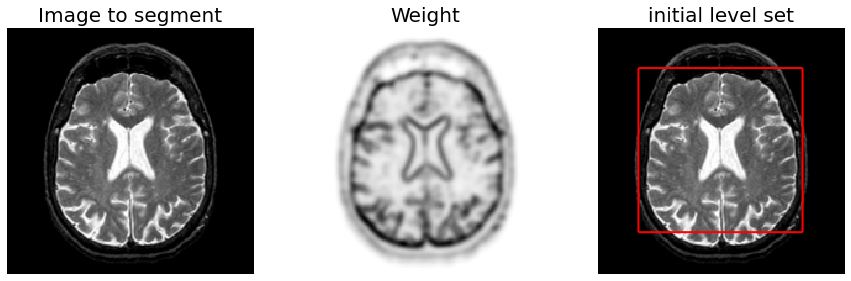

In [310]:
n = 200
f0 = resize(imread('images/cortex.bmp', as_gray=True), (n,n))
print(f0.shape)
g = grad(f0)
d0 = np.sqrt(np.sum(g**2, 2))
a = 2 #5
d = gaussian(d0, a)
epsilon = 1e-1
W = 1/(epsilon + d)  
W = rescale(-d, 0.1, 1)

Tmax = 1000 #200
η = 0.4 #0.05
niter = int(Tmax/η)
y, x = np.meshgrid(np.arange(1,n+1), np.arange(1,n+1))
r = n/3.
c = np.asarray([n,n])/2
φ0 = np.maximum(abs(x-c[0]), abs(y-c[1])) - r

plt.figure(figsize=(15,7))
plt.subplot(131), plot_image(f0, "Image to segment")
plt.subplot(132), plot_image(W, "Weight")
plt.subplot(133), plot_levelset(φ0, 0, f0), plt.title('initial level set', size=20)
plt.show()

2500


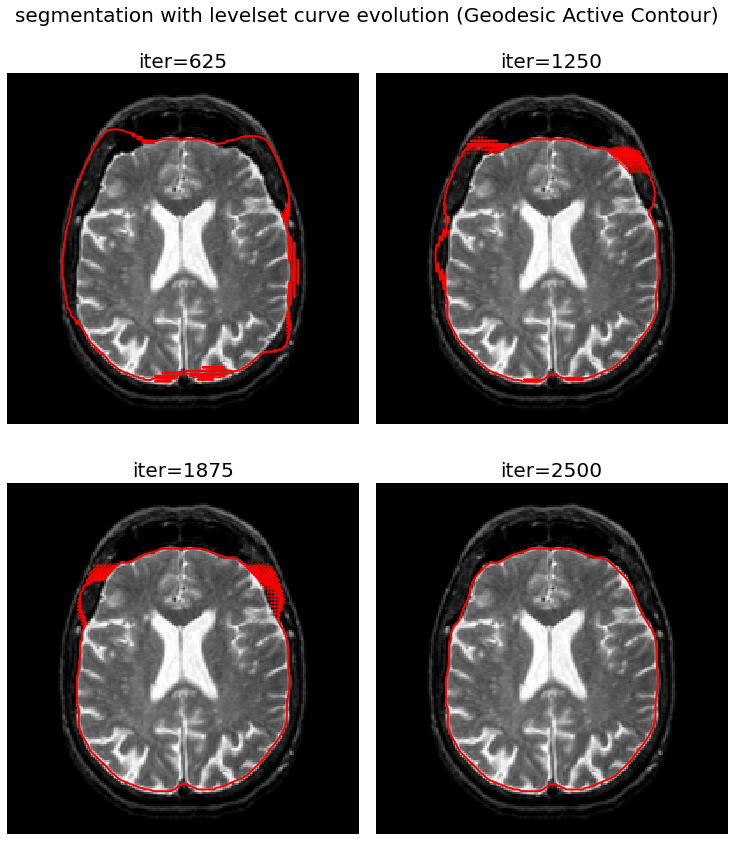

In [311]:
plt.figure(figsize=(10,12))
plt.subplots_adjust(0,0,1,0.925,0.05,0.05)
φ = np.copy(φ0)
k = 0
gW = grad(W)
print(niter)    
for i in range(1,niter+1):
    gD = grad(φ) 
    d = np.maximum(epsilon*np.ones([n,n]), np.sqrt(np.sum(gD**2, 2)))
    g = gD / np.repeat(d[:,:,np.newaxis], 2, 2)
    G = W*d*div(g[:,:,0], g[:,:,1]) + np.sum(gW*gD,2)
    φ = φ + η*G
    #if i % 30 == 0:
    #    φ = perform_redistancing(φ)
    if i % int(niter/4.) == 0:
        k = k + 1
        plt.subplot(2, 2, k), plot_levelset(φ,0,f0), plt.title(f'iter={i}', size=20)
plt.suptitle('segmentation with levelset curve evolution (Geodesic Active Contour)', size=20)
plt.show()

### **14.2 Region-based Segmentation with Chan-Vese**

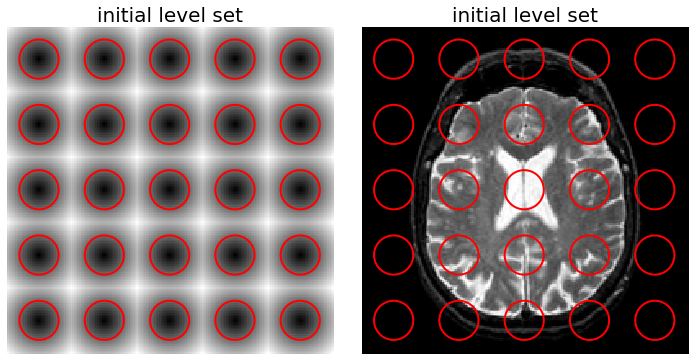

In [314]:
λ = 2
c1, c2 = 0.7, 0
η = .5
Tmax = 100
niter = int(Tmax/ η)
f0 = resize(imread('images/cortex.bmp', as_gray=True), (n,n))

Y,X = np.meshgrid(np.arange(1,n+1), np.arange(1,n+1))
k = 5 #number of circles
r = .3*n/k
φ0 = np.zeros([n,n])+ float("inf")

for i in range(1,k+1):
    for j in range(1,k+1):
        c = (np.asarray([i,j]) - 1)*(n/k) + (n/k)*.5
        φ0 = np.minimum(φ0,np.sqrt(abs(X-c[0])**2 + abs(Y-c[1])**2) - r)
        
plt.figure(figsize=(10,5))
plt.subplot(1,2,1), plot_levelset(φ0,0), plt.title('initial level set', size=20)
plt.subplot(1,2,2), plot_levelset(φ0, 0, f0), plt.title('initial level set', size=20)
plt.tight_layout()
plt.show()

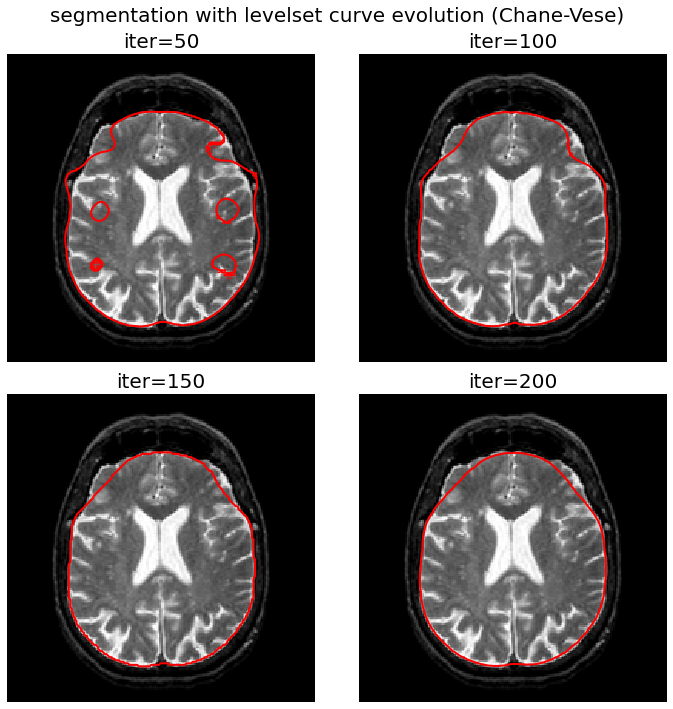

In [316]:
φ = np.copy(φ0)
k = 0

plt.figure(figsize=(10,10))

for i in range(1,niter+1):
    gD = grad(φ) #, order=2)
    d = np.maximum(eps*np.ones([n,n]), np.sqrt(np.sum(gD**2, 2)))
    g = gD/np.repeat(d[:,:,np.newaxis], 2, 2)
    G = d*div(g[:,:,0], g[:,:,1]) - λ*(f0-c1)**2 + λ*(f0-c2)**2
    φ = φ + η*G
    if i % 30 == 0:
        φ = perform_redistancing(φ)
    if i % int(niter/4.) == 0:
        k = k + 1
        plt.subplot(2, 2, k), plot_levelset(φ,0,f0), plt.title(f'iter={i}', size=20)
        
plt.suptitle('segmentation with levelset curve evolution (Chane-Vese)', size=20)
plt.tight_layout()
plt.show()

## **Shape from Shading, Photometric Stereo, and Surface Reconstruction**

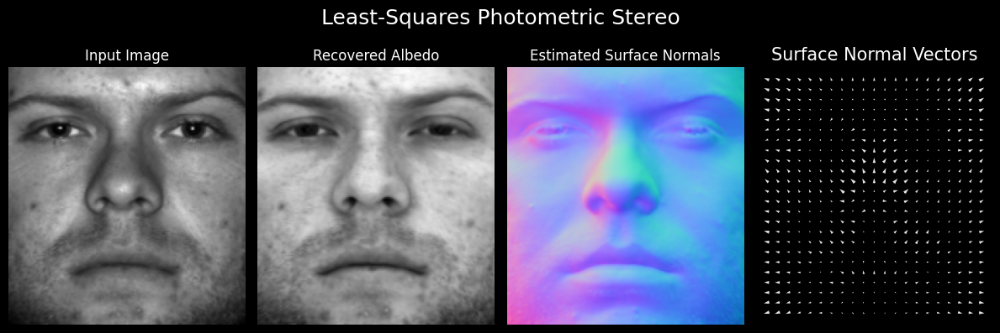

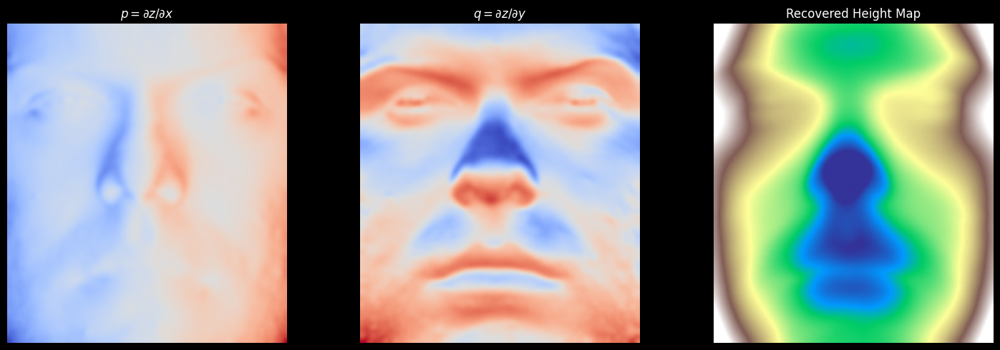

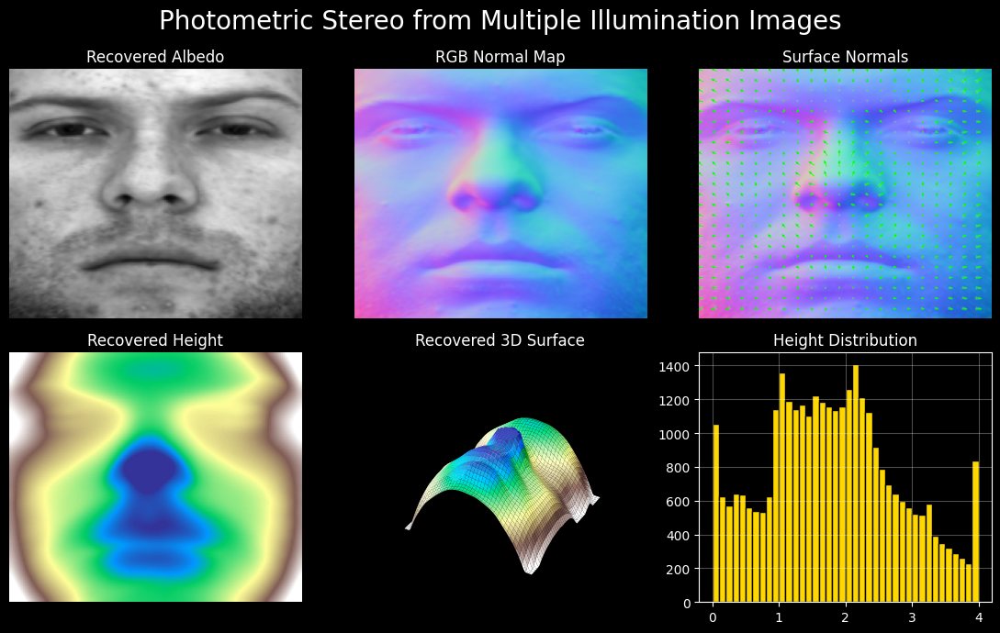

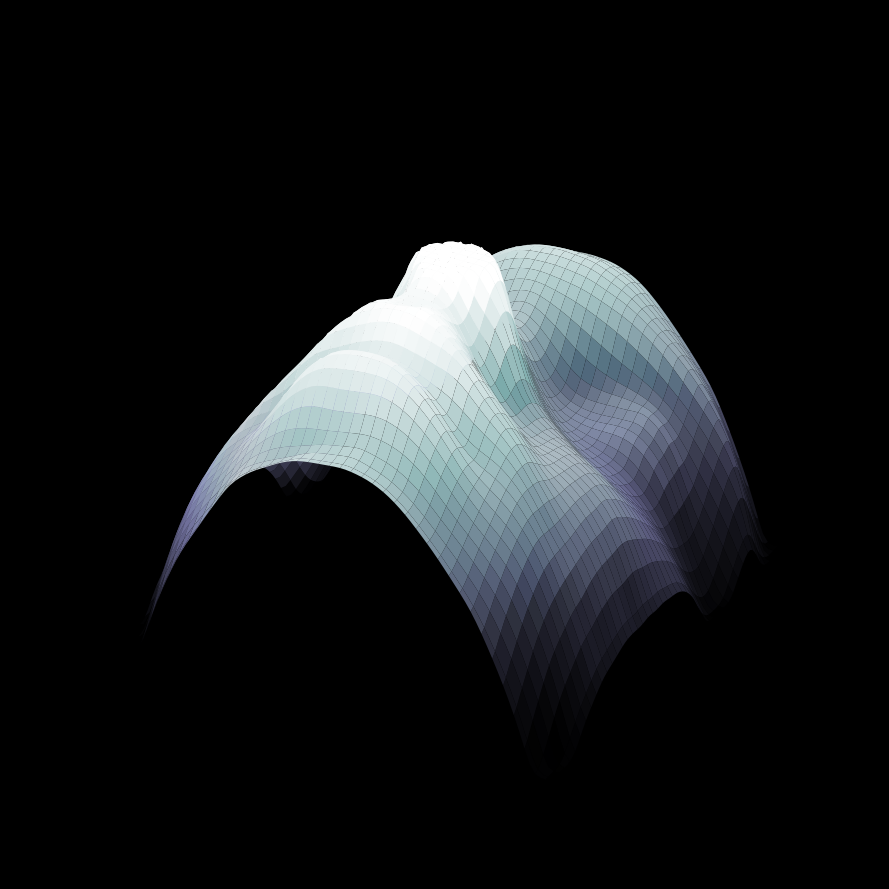

In [10]:
"""
Photometric Stereo using Least Squares
======================================

Part I
------
• Load photometric stereo dataset
• Vectorized least-squares photometric stereo
• Recover albedo and surface normals
"""

import os
from glob import glob
from PIL import Image
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LightSource

plt.style.use("dark_background")


# Dataset Loader
def load_photometric_dataset(folder):
    """
    Load images, mask and light directions.

    Returns
    -------
    images : H x W x N
        Stack of input images
    mask : H x W
        Object mask
    lights : N x 3
        Illumination directions
    """

    mask = cv2.imread(
        os.path.join(folder, "mask.png"),
        0
    ) > 0


    lights = np.loadtxt(
        os.path.join(folder, "lights.txt")
    )


    files = sorted(
        glob(os.path.join(folder, "image*.png"))
    )


    images = np.stack(
        [
            cv2.imread(f, 0).astype(np.float32)/255.
            for f in files
        ],
        axis=-1
    )

    return images, mask, lights

def load_yale_dataset(subject_dir, subject, n_images=64):

    def read(fname):
        return np.asarray(Image.open(fname), np.float32)

    def angles(fname):
        name = os.path.basename(fname)
        az = int(name[12:16])
        el = int(name[17:20])
        return az, el

    # Preprocess
    def preprocess(ambient, images):
        images = images - ambient[...,None]
        images = np.maximum(images,0)
        images /= images.max()
        return images

    ambient = read(os.path.join(subject_dir,
                                f"{subject}_P00_Ambient.pgm"))

    files = sorted(glob(
        os.path.join(subject_dir, f"{subject}_P00A*.pgm")
    ))

    if n_images < len(files):
        np.random.seed(0)
        files = sorted(np.random.choice(files, n_images, replace=False))

    images = np.stack([read(f) for f in files], axis=-1)

    ang = np.array([angles(f) for f in files])

    az = np.deg2rad(ang[:,0])
    el = np.deg2rad(ang[:,1])

    x = np.cos(el)*np.cos(az)
    y = np.cos(el)*np.sin(az)
    z = np.sin(el)

    lights = np.c_[y,z,x]
    #lights = np.stack([x, y, z], axis=-1)

    return images, lights

# Least Squares Photometric Stereo
def photometric_stereo(images, lights):
    """
    Recover albedo and surface normals.

    I = L G

    where

    L : lighting matrix (N x 3)
    G : scaled normals (3 x pixels)

    Returns
    -------
    albedo : H x W
    normals : H x W x 3
    """

    H, W, N = images.shape


    # pixels x images -> images x pixels
    I = images.reshape(-1, N).T


    # Least squares solution
    G = np.linalg.lstsq(
        lights,
        I,
        rcond=None
    )[0]


    # magnitude gives albedo
    albedo = np.linalg.norm(
        G,
        axis=0
    )


    # normalize gives normals
    normals = G / (
        albedo + 1e-8
    )


    albedo = albedo.reshape(H, W)


    normals = (
        normals.T
        .reshape(H, W, 3)
    )


    # ensure unit normals
    normals /= (
        np.linalg.norm(
            normals,
            axis=2,
            keepdims=True
        )
        + 1e-8
    )
    return albedo, normals


# Main Pipeline
def run_photometric_stereo(images, lights, mask=None):

    # Visualization
    def visualize_results(images,
                          mask,
                          albedo,
                          normals,
                          save_path=None):
    
        # Normal Visualization
        def normals_to_rgb(normals):
            """
            Convert surface normals to RGB visualization.
            """
            return np.clip(
                (normals + 1)/2,
                0,
                1
            )
    
        normal_rgb = normals_to_rgb(normals)
        fig = plt.figure(figsize=(12,4))
        plots = [(images[:,:,0], "Input Image", "gray"),]
        if mask is not None:
            plots += [(mask, "Mask","gray"),]
        plots += [(albedo, "Recovered Albedo", "gray"), (normal_rgb, "Estimated Surface Normals", None)]
        pi = 141 if mask is None else 151
        for i,(img,title,cmap) in enumerate(plots,1):
    
            plt.subplot(pi+i-1)
    
            plt.imshow(
                img,
                cmap=cmap,
                aspect = 'auto'
            )
    
            plt.title(title)
            plt.axis("off")
    
        H, W = albedo.shape
    
        step = 8
        Y, X = np.mgrid[0:H:step, 0:W:step]
        U = -normals[::step, ::step, 0]
        V =  normals[::step, ::step, 1]
        if mask is not None:
            mask =  mask[::step, ::step]
            U[~mask], V[~mask] = 0, 0
        ax = plt.subplot(pi+i)
        #ax.imshow(normal_rgb)
        ax.quiver(
            X, Y, U, V,
            color="white",
            scale=35,
            width=0.006,
            alpha=0.9,
            pivot="mid"
        )
        ax.invert_yaxis()
        ax.set_title("Surface Normal Vectors", fontsize=15)
        ax.axis("off")
    
        plt.suptitle(
            "Least-Squares Photometric Stereo",
            fontsize=18
        )
    
        plt.tight_layout()
    
    
        if save_path:
            plt.savefig(
                save_path,
                dpi=300,
                bbox_inches="tight"
            )
        plt.show()

    # Mask Background
    def apply_mask(albedo, normals, mask):
        """
        Remove background pixels.
        """
    
        albedo = albedo.copy()
        normals = normals.copy()
        albedo[~mask] = 0
        normals[~mask] = 0
        return albedo, normals
        
    albedo, normals = photometric_stereo(images, lights)
    if mask is not None:
       albedo, normals = apply_mask(albedo, normals, mask)
    visualize_results(images, mask, albedo, normals, "images/photometric_stereo.png")
    return albedo, normals

# Recover Height Map from Surface Normals
def get_surface(normals, sigma=1.2):
    """
    Recover a height map from surface normals using
    Frankot-Chellappa integration.

    Parameters
    ----------
    normals : (H,W,3)
        Estimated unit surface normals.
    sigma : float
        Gaussian smoothing of gradients.

    Returns
    -------
    height : (H,W)
        Normalized height map.
    p, q : (H,W)
        Surface gradients (for visualization).
    """

    eps = 1e-8

    Nx, Ny, Nz = normals[...,0], normals[...,1], normals[...,2]

    # surface gradients
    p = -Nx/(Nz + eps)
    q = -Ny/(Nz + eps)

    # smooth gradients
    if sigma > 0:
        p = cv2.GaussianBlur(p.astype(np.float32), (0,0), sigma)
        q = cv2.GaussianBlur(q.astype(np.float32), (0,0), sigma)

    H, W = p.shape

    wx = np.fft.fftfreq(W) * 2*np.pi
    wy = np.fft.fftfreq(H) * 2*np.pi

    WX, WY = np.meshgrid(wx, wy)

    P = np.fft.fft2(p)
    Q = np.fft.fft2(q)

    denom = WX**2 + WY**2
    denom[0,0] = 1

    height = (-1j*WX*P -1j*WY*Q) / denom
    height[0,0] = 0

    height = np.real(np.fft.ifft2(height))

    # smooth reconstructed surface
    height = cv2.GaussianBlur(height.astype(np.float32), (0,0), 1.0)

    # robust normalization
    lo, hi = np.percentile(height, (2,98))
    height = np.clip((height-lo)/(hi-lo+1e-8), 0, 1)

    return height, p, q

def visualize_heightmap(p, q, height):
    plt.figure(figsize=(15,5))
    
    plt.subplot(131)
    plt.imshow(p, cmap="coolwarm")
    plt.title(r"$p=\partial z/\partial x$")
    plt.axis("off")
    
    plt.subplot(132)
    plt.imshow(q, cmap="coolwarm")
    plt.title(r"$q=\partial z/\partial y$")
    plt.axis("off")
    
    plt.subplot(133)
    plt.imshow(height, cmap="terrain")
    plt.title("Recovered Height Map")
    plt.axis("off")
    
    plt.tight_layout()
    plt.show()

def plot_all(height, normals, albedo):

    plt.style.use("dark_background")

    H,W = height.shape

    X,Y = np.meshgrid(np.arange(W),np.arange(H))

    normal_rgb = np.clip((normals+1)/2,0,1)

    Z = height.copy()

    lo,hi = np.percentile(Z,(2,98))
    Z = np.clip((Z-lo)/(hi-lo+1e-8),0,1)

    Z *= 4

    ls = LightSource(315,45)

    rgb = ls.shade(
        Z,
        cmap=plt.cm.terrain,
        vert_exag=3,
        blend_mode='overlay'
    )

    step = 8

    Xq,Yq = np.meshgrid(
        np.arange(0,W,step),
        np.arange(0,H,step)
    )

    U = -normals[::step,::step,0]
    V =  normals[::step,::step,1]

    fig = plt.figure(figsize=(11,7))

    # ---------------- Albedo ----------------

    ax=fig.add_subplot(231)
    ax.imshow(albedo,cmap='gray', aspect='auto')
    ax.set_title("Recovered Albedo")
    ax.axis('off')

    # ---------------- Normals ----------------

    ax=fig.add_subplot(232)
    ax.imshow(normal_rgb, aspect='auto')
    ax.set_title("RGB Normal Map")
    ax.axis('off')

    # ---------------- Quiver ----------------

    ax=fig.add_subplot(233)
    ax.imshow(normal_rgb, aspect='auto')

    ax.quiver(
        Xq,Yq,U,V,
        color='white',
        scale=35,
        width=0.010,
        alpha=.08,
        pivot='mid'
    )

    ax.quiver(
        Xq,Yq,U,V,
        color='#99FF66',
        scale=35,
        width=.006,
        alpha=.25,
        pivot='mid'
    )

    ax.quiver(
        Xq,Yq,U,V,
        color='lime',
        scale=35,
        width=.0025,
        headwidth=3.5,
        headlength=4,
        pivot='mid'
    )

    ax.set_title("Surface Normals")
    ax.axis('off')

    # ---------------- Height ----------------

    ax=fig.add_subplot(234)

    im=ax.imshow(Z,cmap='terrain', aspect='auto')

    ax.set_title("Recovered Height")

    ax.axis('off')

    #plt.colorbar(im,ax=ax,shrink=.75)

    # ---------------- 3D ----------------

    ax=fig.add_subplot(235,projection='3d')

    s=2

    ax.plot_surface(
        X[::s,::s],
        Y[::s,::s],
        1-Z[::s,::s],
        facecolors=rgb[::s,::s],
        linewidth=0,
        antialiased=True,
        shade=False
    )

    ax.view_init(35,120)

    ax.set_proj_type('persp')

    ax.set_box_aspect((1,1,.6))

    ax.set_axis_off()

    ax.set_title("Recovered 3D Surface")

    # ---------------- Histogram ----------------

    ax=fig.add_subplot(236)

    ax.hist(
        Z.ravel(),
        bins=40,
        color='gold',
        edgecolor='black'
    )

    ax.grid(alpha=.3)

    ax.set_title("Height Distribution")

    plt.suptitle(
        "Photometric Stereo from Multiple Illumination Images",
        fontsize=20
    )

    plt.tight_layout()

    plt.show()

def plot_depth(Z):

    Z = Z.astype(np.float32)

    # remove global offset
    Z -= np.median(Z)

    # normalize robustly
    lo, hi = np.percentile(Z, (2,98))
    Z = (Z-lo)/(hi-lo+1e-8)
    Z = np.clip(Z,0,1)

    # convex instead of concave
    Z = 1 - Z

    # exaggerate depth
    Z *= 6

    H, W = Z.shape

    X, Y = np.meshgrid(np.arange(W), np.arange(H))

    # image -> Cartesian coordinates
    Y = H - Y

    # smooth for visualization
    Z = cv2.GaussianBlur(Z,(0,0),1.5)

    # downsample
    step = 2

    X = X[::step,::step]
    Y = Y[::step,::step]
    Z = Z[::step,::step]

    ls = LightSource(azdeg=315, altdeg=45)

    rgb = ls.shade(
        Z,
        cmap=plt.cm.bone,
        vert_exag=2.5,
        blend_mode='overlay'
    )

    fig = plt.figure(figsize=(9,9))

    ax = fig.add_subplot(111, projection='3d')

    ax.plot_surface(
        X,
        Y,
        Z,
        facecolors=rgb,
        linewidth=0,
        antialiased=True,
        shade=False
    )

    ax.view_init(elev=30, azim=-60)

    ax.set_proj_type('persp')

    ax.set_box_aspect((1,1,0.7))

    ax.set_axis_off()

    plt.tight_layout()

    plt.show()

ROOT = "images/croppedyale"
SUBJECT = "yaleB01"
images, lights = load_yale_dataset(os.path.join(ROOT,SUBJECT), SUBJECT, n_images=64)
albedo, normals = run_photometric_stereo(images, lights)
height, p, q = get_surface(normals)
visualize_heightmap(p, q, height)
plot_all(height, normals, albedo)
plot_depth(height)

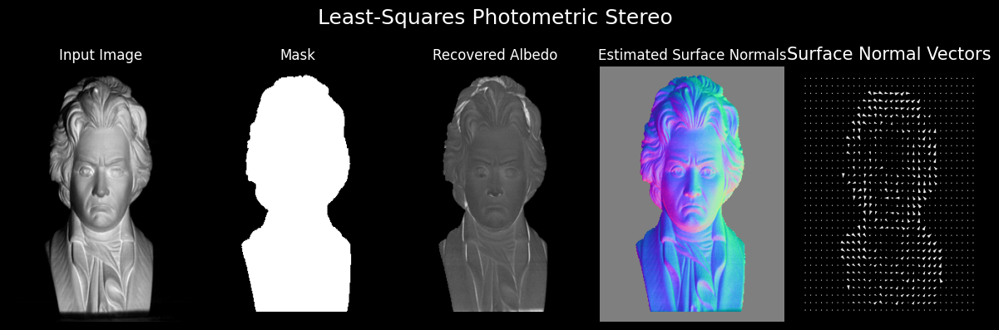

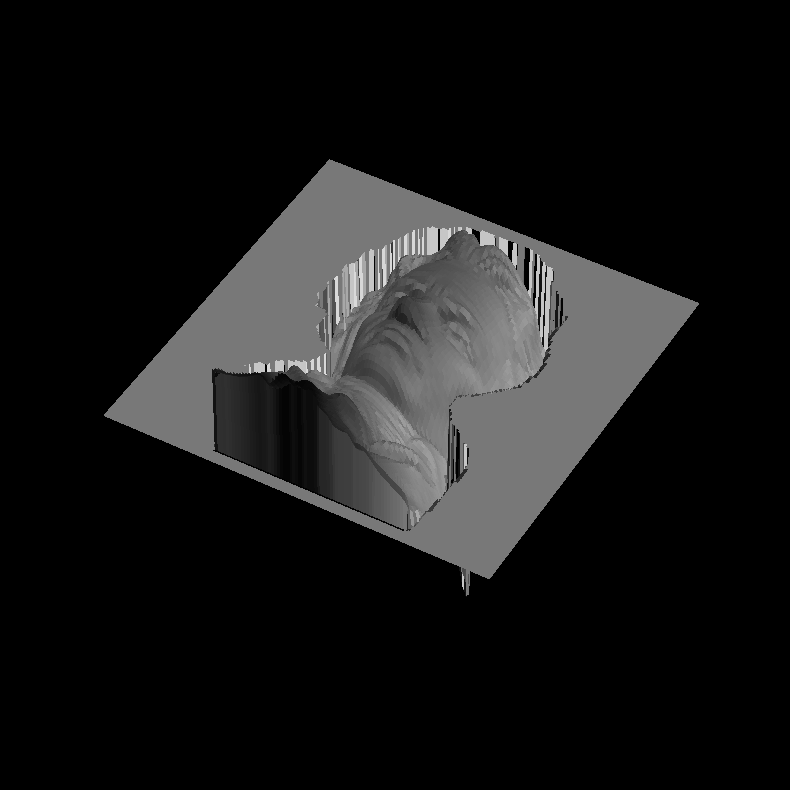

In [20]:
from mpl_toolkits.mplot3d import Axes3D
from scipy import fftpack as fft
import scipy.sparse as sp
from scipy.sparse.linalg import spsolve
from scipy.io import loadmat
import warnings
warnings.filterwarnings('ignore')  # Suppress all warnings

def unbiased_integrate(images, lights, mask, order=2):
    """
    Constructs the finite difference matrix, domain and other information
    for solving the Poisson system and solve it. Port of Yvain's implementation, 
    even  respecting the comments :-)
    
    Arguments:
    ----------
    n1, n2, n3, mask: numpy arrays
        all arrays must have the same size, say (m,n)
        n1, n2 and n3 are the three components of field of 
        normal vectors to the surface we want to reconstruct, obtained by 
        solving the system formed by the light sources and measured intensities,
        and then after albedo normalization.
        
    order: int
        default value of 2 is a good idea, don't change it
    
    Returns:
    -------
    z: numpy array
        array of size (m,n), with computed depth values inside the 
        make region (mask > 0) and NaN (Not a Number) in the region mask == 0.
    It solves for the system comming from the discretization of
           -Laplacian(z) - Divergence(n1/n3, n2/n3) = 0
    with some boundary conditions, it gives a discretized Poisson system
        AZ = b
    and z is obtained by mapping the values in Z to the region of the 2D image
    of size (m,n) where mask > 0. The rest of the z-image values are set to NaN.
    """

    def tolist(A):
        """
        Linearize array to a 1D list
        """
        return list(np.reshape(A, A.size))

    I_all = np.vstack([images[:,:,i].flatten() for i in range(images.shape[-1])])

    M = np.linalg.pinv(lights).dot(I_all)
    M_1 = M[0]
    M_2 = M[1]
    M_3 = M[2]
    
    rho = np.sqrt(M_1**2 + M_2**2 + M_3**2).reshape(images.shape[0],images.shape[1])
    
    n1 = (M_1 / rho.reshape(-1)).reshape(images.shape[0],images.shape[1])
    n2 = (M_2 / rho.reshape(-1)).reshape(images.shape[0],images.shape[1])
    n3 = (M_3 / rho.reshape(-1)).reshape(images.shape[0],images.shape[1])

    p = -n1/n3
    q = -n2/n3

    # Calculate some usefuk masks
    m,n = mask.shape
    Omega = np.zeros((m,n,4))
    Omega_padded = np.pad(mask, (1,1), mode='constant', constant_values=0)
    Omega[:,:,0] = Omega_padded[2:,1:-1]*mask
    Omega[:,:,1] = Omega_padded[:-2,1:-1]*mask
    Omega[:,:,2] = Omega_padded[1:-1,2:]*mask
    Omega[:,:,3] = Omega_padded[1:-1,:-2]*mask
    del Omega_padded

    # Mapping    
    indices_mask = np.where(mask > 0)
    lidx = len(indices_mask[0])
    mapping_matrix = np.zeros(p.shape, dtype=int)
    mapping_matrix[indices_mask] = list(range(lidx))

    if order == 1:
        pbar = p.copy()
        qbar = q.copy()
    elif order == 2:
        pbar = 0.5*(p + p[list(range(1,m)) + [m-1], :])
        qbar = 0.5*(q + q[:, list(range(1,n)) + [n-1]])

    # System
    I = []
    J = []
    K = []
    b = np.zeros(lidx)


    # In mask, right neighbor in mask
    rset = Omega[:,:,2]
    X, Y = np.where(rset > 0)
    #indices_center = sub2ind(mask.shape, X, Y)
    I_center = mapping_matrix[(X,Y)].astype(int)
    #indices_neighbors = sub2ind(mask.shape, X, Y+1)
    I_neighbors = mapping_matrix[(X,Y+1)]
    lic = len(X)
    A_center = np.ones(lic)
    A_neighbors = -A_center
    K += tolist(A_center) + tolist(A_neighbors)
    I += tolist(I_center) + tolist(I_center)
    J += tolist(I_center) + tolist(I_neighbors)
    b[I_center] -= qbar[(X,Y)]

    #	In mask, left neighbor in mask
    lset = Omega[:,:,3]
    X, Y = np.where(lset > 0)
    #indices_center = sub2ind(mask.shape, X, Y)
    I_center = mapping_matrix[(X,Y)].astype(int)
    #indices_neighbors = sub2ind(mask.shape, X, Y-1)
    I_neighbors = mapping_matrix[(X,Y-1)]
    lic = len(X)
    A_center = np.ones(lic)
    A_neighbors = -A_center
    K += tolist(A_center) + tolist(A_neighbors)
    I += tolist(I_center) + tolist(I_center)
    J += tolist(I_center) + tolist(I_neighbors)
    b[I_center] += qbar[(X,Y-1)]


    # In mask, top neighbor in mask
    tset = Omega[:,:,1]
    X, Y = np.where(tset > 0)
    #indices_center = sub2ind(mask.shape, X, Y)
    I_center = mapping_matrix[(X,Y)].astype(int)
    #indices_neighbors = sub2ind(mask.shape, X-1, Y)
    I_neighbors = mapping_matrix[(X-1,Y)]
    lic = len(X)
    A_center = np.ones(lic)
    A_neighbors = -A_center
    K += tolist(A_center) + tolist(A_neighbors)
    I += tolist(I_center) + tolist(I_center)
    J += tolist(I_center) + tolist(I_neighbors)
    b[I_center] += pbar[(X-1,Y)]

    #	In mask, bottom neighbor in mask
    bset = Omega[:,:,0]
    X, Y = np.where(bset > 0)
    #indices_center = sub2ind(mask.shape, X, Y)
    I_center = mapping_matrix[(X,Y)].astype(int)
    #indices_neighbors = sub2ind(mask.shape, X+1, Y)
    I_neighbors = mapping_matrix[(X+1,Y)]
    lic = len(X)
    A_center = np.ones(lic)
    A_neighbors = -A_center
    K += tolist(A_center) + tolist(A_neighbors)
    I += tolist(I_center) + tolist(I_center)
    J += tolist(I_center) + tolist(I_neighbors)
    b[I_center] -= pbar[(X,Y)]

    # Construction de A : 
    A = sp.csc_matrix((K, (I, J)))
    A = A + sp.eye(A.shape[0])*1e-9
    z = np.nan*np.ones(mask.shape)
    z[indices_mask] = spsolve(A, b)
    z[np.isnan(z)] = 0
    return z

def plot_heightmap(height):    
    z = height
    m, n = z.shape
    x, y = np.mgrid[0:m, 0:n]
    fig, ax = plt.subplots(subplot_kw={"projection": "3d"}, figsize=(10,10))
    ls = LightSource(azdeg=0, altdeg=65)
    greyvals = ls.shade(z, plt.cm.Greys)
    ax.plot_surface(x, y, z, 
                    rstride=2, cstride=2, 
                    linewidth=0, antialiased=False, facecolors=greyvals)
    ax.view_init(elev=45, azim=30)
    #set_aspect_equal_3d(ax)
    plt.axis('off')
    #plt.axis('auto')
    plt.show()
    
images, mask, lights = load_photometric_dataset("images/phstereo/beethoven")
albedo, normals = run_photometric_stereo(images, lights, mask)
height = unbiased_integrate(images, lights, mask)
plot_heightmap(height)

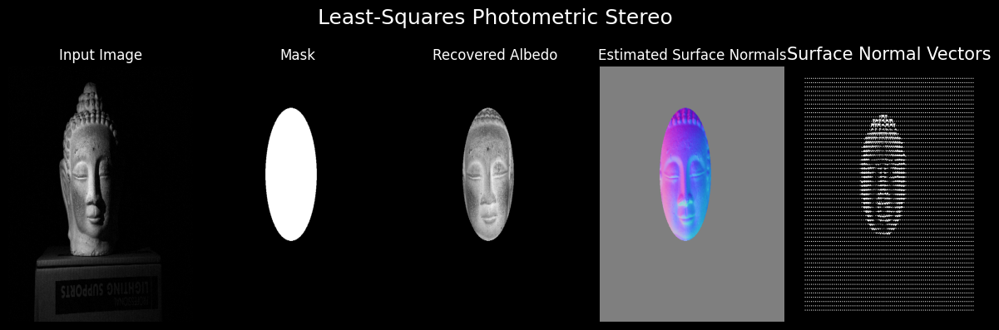

In [60]:
images, mask, lights = load_photometric_dataset("images/phstereo/buddha")
albedo, normals = run_photometric_stereo(images, lights, mask)
height = unbiased_integrate(images, lights, mask)